# Figure 4, threshold-free 2D reanalysis

**Reviewer comment.** *"The Figure 4 analysis relies on five stacked categorical labels (tile membership, epithelial vs stromal majority label, CXCR3L +/- percentile cutoffs, hub boundary type, and 5-micron distance shells), each discarding continuous spatial information. We would recommend a complementary threshold-free reanalysis: for every cell, compute a signed distance in microns to the nearest epithelial/stromal boundary ... and a local CXCL9/10/11 transcript density within roughly 30 microns, then visualize abundance or expression of key markers ... as a 2D heatmap over those two axes."*

### What this replaces

In Figure 4C-E, hub status is a **three-level categorical grouping** (Hub-inside MMRd, Hub-outside MMRd, MMRp) shown in the legend, and distance is binned into 5 µm shells. Here the grouping variable becomes a **continuous y axis**, local *CXCL9/10/11* density, and distance stays continuous on the x axis. Nothing else about the question changes.

| axis | quantity |
|---|---|
| x | signed distance to nearest epithelial/stromal interface (µm; negative into stroma, positive into epithelium) |
| y | local *CXCL9/10/11* transcript density within 30 µm, per 10,000 transcripts in that neighbourhood, log1p |

### Panels

- **A, abundance**, as % of all cells in the bin. Populations match **Figure 4D** (Myeloid-ISG, Myeloid-mregDC) and **Figure 4E** (the indicated T cell subsets). Estimator matches **Figure S5B/S5C**.
- **B, expression** of *ITGAE*, *CCR7*, *CXCL13* in all CD8 T cells and in Tcd8-CXCL13-comb.
- **C, expression** of the ISG program (*ISG15*, *STAT1*, *CD274*, *GBP1*, *TAP1*, *IDO1*) in Myeloid-ISG and in pooled myeloid excluding DC and granulocytes. *CXCL9* and *CXCL10* are shown in a **separate positive-control figure**, because they contribute to the y axis through neighbouring cells and are therefore expected to track it.

Each panel set is drawn **once per MMR arm**, never pooled.

### Design decisions carried into the response letter

- **Fixed 30 µm radius, not kNN.** Cell density peaks at the interface (Figure S4C), so a fixed-neighbour-count window is physically smaller there and would put a density artefact on the y axis.
- **Same-subtype neighbours not excluded.** The quantity is the chemokine field as the receiving cell experiences it. The anchor cell's own transcripts are excluded.
- **Patient is the unit of replication.** Statistics computed within patient, then combined across patients by median.
- **Pooled ratio estimator** for expression (`sum(gene)/sum(total)` within patient × bin), which is stable at MERFISH depths and puts sequencing depth in the denominator.
- **Raw chemokine magnitudes preserved**: no per-sample normalisation, so bin edges are shared across arms and the arms' different chemokine levels remain visible.
- **One bin resolution throughout** (5 µm × 10 chemokine bins), matching the Figure 4C-E distance shells.

## 0. Setup and parameters

In [1]:
## src/rload.R eagerly loads data/GSE_files/{single_cell_annots_obs,metatable}.csv.
## This notebook uses NEITHER, labels come from the pathology CSV, geometry and
## patient metadata from tile_metadata, counts from the slim extract. rload.R is
## sourced if present and skipped cleanly if not.
rload_ok <- tryCatch({
    source(here::here("src/rload.R")); TRUE
}, error = function(e) {
    message("rload.R not sourced (", conditionMessage(e), "), continuing")
    FALSE
})

library(here); library(data.table); library(tidyverse)
library(sf); library(geos); library(furrr)
library(readxl); library(dbscan); library(Matrix)
library(ggplot2); library(cowplot); library(patchwork)

if (!exists("fig.size")) {
    fig.size <- function(height = 5, width = 7, res = 150)
        options(repr.plot.height = height, repr.plot.width = width, repr.plot.res = res)
}

set.seed(42)
plan(multisession)
options(future.globals.maxSize = 1e10)

Loading packages


Warning message in check_dep_version(dep_pkg = "TMB"):
“package version mismatch: 
glmmTMB was built with TMB package version 1.9.19
Current TMB package version is 1.9.23
Please re-install glmmTMB from source or restore original ‘TMB’ package (see '?reinstalling' for more information)”


Saving output data and figures to: 
/home/helikarlab/mukta/crcmanuscript2025/outputs


Warning message in dir.create(outdir, showWarnings = TRUE):
“'/home/helikarlab/mukta/crcmanuscript2025/outputs' already exists”


Loading data files


rload.R not sourced (File '/home/helikarlab/mukta/crcmanuscript2025/data/GSE_files/single_cell_annots_obs.csv' does not exist or is non-readable. getwd()=='/home/helikarlab/mukta/crcmanuscript2025/fig4_interface_analysis'), continuing

Linking to GEOS 3.14.1, GDAL 3.13.3, PROJ 9.8.1; sf_use_s2() is TRUE

Loading required package: future


Attaching package: ‘dbscan’


The following object is masked from ‘package:stats’:

    as.dendrogram



Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



Attaching package: ‘cowplot’


The following object is masked from ‘package:patchwork’:

    align_plots


The following object is masked from ‘package:ggpubr’:

    get_legend


The following object is masked from ‘package:lubridate’:

    stamp




In [2]:
## ---- paths ---------------------------------------------------------------
TESSERA_DIR     <- "../Tessera tiles/Tessera processed results"
INTERFACE_DIR   <- "../Tessera tiles/Spatial objects for tumor-stromal interfaces in all MERFISH samples"
PATHOLOGY_CSV   <- "../Pathology annotations/figure2/pathology_regions_postQC.csv"
SLIM_RDS        <- "../Labeled MERFISH data/counts/fig4_counts_slim.rds"

outdir_tf <- "./fig4_threshold_free_outputs"
dir.create(outdir_tf, showWarnings = FALSE, recursive = TRUE)

## ---- parameters ----------------------------------------------------------
RADIUS_UM    <- 30    # chemokine neighbourhood radius
DIST_LIM     <- 100   # |signed distance| cap, µm
DIST_BIN     <- 5     # matches the Fig. 4C-E shells
CXCL_N_BINS  <- 10
MIN_CELLS    <- 10    # per patient x bin
MIN_PAT_FRAC <- 0.5   # min fraction of an MMR arm contributing to a bin

N_SCATTER_PER_PATIENT <- 4000

ARMS <- c("MMRd", "MMRp")

## ---- KDE contour behaviour ----------------------------------------------
## Default nrd bandwidths produce isolated low-density islands where detection
## is sparse (visible as stray CCR7 blobs at -60 to -75 um). Two corrections:
## widen the bandwidth, and contour on NORMALISED density so the lowest levels
## can be cut rather than drawn.
KDE_ADJUST     <- 1.8                      # bandwidth multiplier
CONTOUR_BREAKS <- c(0.2, 0.4, 0.6, 0.8)    # fractions of each set's peak density

## ---- final publication figures ------------------------------------------
## Genes differ by row: the CD8 markers the reviewer named, and the three
## most highly expressed ISG-programme genes (STAT1 3.5%, TAP1 1.5%, GBP1 0.8%
## of transcripts in Myeloid-ISG; ISG15, CD274 and IDO1 are ~10x lower).
FINAL_GENES_T   <- c("ITGAE", "CCR7", "CXCL13")
FINAL_GENES_ISG <- c("STAT1", "TAP1", "GBP1")

FINAL_SPECS <- list(
    ## v1: the exact subsets named in the comment
    v1_named_subsets = list(
        "Tcd8-CXCL13-comb" = FINAL_GENES_T,
        "Myeloid-ISG"      = FINAL_GENES_ISG
    ),
    ## v2: the same genes in the parent populations
    v2_parent_populations = list(
        "CD8-all"             = FINAL_GENES_T,
        "Myeloid-noDC-noGran" = FINAL_GENES_ISG
    )
)

FINAL_ARM <- "MMRd"
FINAL_W   <- 7.5   # inches; letter page minus margins
FINAL_H   <- 5.6   # taller so 8pt+ labels are not cramped; legend still fits

## ---- genes ---------------------------------------------------------------
GENES_AXIS   <- c("CXCL9", "CXCL10", "CXCL11")
GENES_B      <- c("ITGAE", "CCR7", "CXCL13")
GENES_C      <- c("ISG15", "STAT1", "CD274", "GBP1", "TAP1", "IDO1")
GENES_C_CTRL <- c("CXCL9", "CXCL10")   # contribute to the y axis via neighbours

### Cell-state vocabulary

Three renaming layers exist in this project. Layers 1 and 2 are applied here;
layer 3 is cosmetic and applied only to figure labels.

1. **`KNN_celltype_v2` → `knn_renamed_cell_states`**, already materialised as two
   columns in the pathology file. 65 old labels map to 58 new ones: the eight
   `Epi-*` subtypes collapse to `Epi`, and `Fibro-CXCL14` becomes
   `Fibro-GREM1-low`. No label splits; every other label is unchanged.
2. **`Tcd8-gdlike-PD1` → `Tcd8-CXCL13-LAG3`**, a later rename recorded in neither
   column. This is the Tcd8-LAG3 population referred to by the reviewer, and it
   is analysed throughout the manuscript (Figures 1G, 1I, 3B, 4E, 5A, 6F, S7).
3. Display-only shortening (`Myeloid-Macro` → `Macro`, etc.) used for axis
   labels in the published figures.

In [3]:
## Layer 2, applied to knn_renamed_cell_states to give the canonical `cell_state`
MANUAL_RELABEL <- c("Tcd8-gdlike-PD1" = "Tcd8-CXCL13-LAG3")

## ---- population definitions ---------------------------------------------
## "-comb" follows the manuscript Methods exactly: a merge of proliferating and
## non-proliferating states of the SAME population. Tcd8-CXCL13-LAG3 is a
## separate subset and is NOT part of Tcd8-CXCL13-comb.
TCD8_CXCL13_COMB <- c("Tcd8-CXCL13", "Tcd8-CXCL13-prolif")

CD8_ALL <- c("Tcd8-CXCL13", "Tcd8-CXCL13-prolif", "Tcd8-CXCL13-LAG3",
             "Tcd8-GZMK", "Tcd8-HOBIT", "Tcd8-gdlike")

MYELOID_ISG <- c("Myeloid-ISGhigh", "Myeloid-ISGlow")

MYELOID_NO_DC_NO_GRAN <- c(
    "Myeloid-Macro", "Myeloid-Macro-C1Q", "Myeloid-Macro-MMP9-APOE",
    "Myeloid-Macro-prolif", "Myeloid-Macro-SEPP1-LYVE1",
    "Myeloid-Mono-CSF1R", "Myeloid-Mono-S100-VCAN", "Myeloid-Mono-VEGFA",
    "Myeloid-inflamm", MYELOID_ISG
)

## Panel A, populations of Figure 4D (myeloid) and Figure 4E (T cells)
POPS_A <- list(
    "Myeloid-ISG"       = MYELOID_ISG,
    "Myeloid-mregDC"    = "Myeloid-DCmreg",
    "Tcd8-CXCL13-comb"  = TCD8_CXCL13_COMB,
    "Tcd8-CXCL13-LAG3"  = "Tcd8-CXCL13-LAG3",
    "Tcd8-GZMK"         = "Tcd8-GZMK",
    "Tcd8-HOBIT"        = "Tcd8-HOBIT",
    "Tcd4-CXCL13"       = "Tcd4-CXCL13",
    "Tcd4-Treg-comb"    = c("Tcd4-Treg", "Tcd4-Treg-prolif"),
    "Tplzf-gdlike-comb" = c("Tplzf-gdlike", "Tplzf-gdlike-prolif")
)

## Panel B, expression in CD8 T cells
POPS_B <- list(
    "CD8-all"          = CD8_ALL,
    "Tcd8-CXCL13-comb" = TCD8_CXCL13_COMB
)

## Panel C, expression in myeloid
POPS_C <- list(
    "Myeloid-ISG"         = MYELOID_ISG,
    "Myeloid-noDC-noGran" = MYELOID_NO_DC_NO_GRAN
)

POPS_ALL <- c(POPS_A, POPS_B[setdiff(names(POPS_B), names(POPS_A))],
              POPS_C[setdiff(names(POPS_C), names(POPS_A))])

## tessera_annotation values with a defined sign relative to the interface.
## "Granulocyte cap" and "Other" are dropped: the sign is undefined for them.
KEEP_TESSERA <- c("Epithelial-enriched", "Stromal-enriched")

## repo convention (figure2.ipynb, Tessera_analysis_for_sharing.ipynb):
## grepl('Tumor|tumor') collapses Tumor, "Tumor IM" and "Tumor LM" into one class
TUMOR_PATTERN       <- "Tumor|tumor"
APPLY_REGION_FILTER <- TRUE

## 1. Metadata, relabelling, and join

`tile_metadata` supplies geometry, tile assignment, lineage and patient/MMR
status; the pathology file supplies the region annotation and both cell-state
vocabularies. Join key is `tile_metadata$cell_id` ↔ `pathology$sample_cell`,
both in `C107_0` form. The join is inner, cells never assigned to a Tessera
tile are dropped, and the count is reported so the attrition is documented.

In [4]:
## ---- QC tile exclusions (applied in every other Fig. 4 notebook) --------
tiles_to_omit <- read.csv(file.path(TESSERA_DIR,
                                    "tiles_to_exclude_from_interface_analysis.csv")) %>%
    filter(tiles_to_exclude_from_interface_analysis != "") %>%
    pull(agg_id)
cat("tiles excluded by QC:", length(tiles_to_omit), "\n")

## ---- tile metadata -------------------------------------------------------
tile_metadata <- readr::read_rds(file.path(TESSERA_DIR, "tile_metadata_2025-07-22.rds"))
setDT(tile_metadata)
tile_metadata[type_lvl2 == "Mast", type_lvl1 := "Mast"]
cat("tile_metadata rows:", nrow(tile_metadata), "\n")

## ---- pathology annotations, BOTH vocabularies ---------------------------
pathology <- fread(PATHOLOGY_CSV,
                   select = c("sample_cell", "pathology_region",
                              "KNN_celltype_v2", "knn_renamed_cell_states"))
setnames(pathology, "sample_cell", "cell_id")
cat("pathology rows:", nrow(pathology), "\n")

## ---- join ----------------------------------------------------------------
cells <- merge(tile_metadata, pathology, by = "cell_id", all = FALSE)
cat("after join:", nrow(cells), "\n")
cat("dropped (no tile or no pathology annotation):",
    nrow(tile_metadata) - nrow(cells), "\n")

tiles excluded by QC: 121 
tile_metadata rows: 5689782 
pathology rows: 6274656 
after join: 5689782 
dropped (no tile or no pathology annotation): 0 


In [5]:
tile_metadata %>% head

X,Y,ORIG_ID,SampleID,cell_id,Status,type_lvl1,type_lvl2,f,agg_id,agg_cluster,hub_ids,PatientID,cxcl_pos_tile,MMRstatus,leiden_0.1,tessera_annotation
<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<fct>,<dbl>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
45.15206,9472.655,1,C107,C107_0,MMRp,Strom,Fibro-CXCL14,1.438370,C107_1,4,C107_2337,C107,CXCL_neg,MMRp,2,Stromal-enriched
155.54741,9237.368,2,C107,C107_1,MMRp,Strom,Fibro-StemNiche,1.951520,C107_2,4,C107_2500,C107,CXCL_neg,MMRp,2,Stromal-enriched
156.84501,10498.996,3,C107,C107_2,MMRp,Strom,Pericyte,1.644632,C107_3,4,C107_2552,C107,CXCL_neg,MMRp,2,Stromal-enriched
163.14812,8135.527,4,C107,C107_4,MMRp,Strom,Fibro-StemNiche,1.898259,C107_4,4,C107_2603,C107,CXCL_pos,MMRp,2,Stromal-enriched
161.55653,10169.597,5,C107,C107_6,MMRp,Epi,Epi-Stem_TAlike,1.764133,C107_5,3,C107_2126,C107,CXCL_pos,MMRp,1,Epithelial-enriched
102.15540,9860.397,6,C107,C107_7,MMRp,Myeloid,Myeloid-Granulo,2.230309,C107_6,4,C107_2685,C107,CXCL_pos,MMRp,2,Stromal-enriched


In [6]:
## ---- canonical cell_state, layers 1 + 2 ---------------------------------
cells[, cell_state := as.character(knn_renamed_cell_states)]

miss <- setdiff(names(MANUAL_RELABEL), unique(cells$cell_state))
if (length(miss)) stop("MANUAL_RELABEL keys absent from data: ",
                       paste(miss, collapse = ", "))

n_relab <- cells[cell_state %in% names(MANUAL_RELABEL), .N]
cells[cell_state %in% names(MANUAL_RELABEL),
      cell_state := MANUAL_RELABEL[cell_state]]
cat("relabelled", n_relab, "cells:",
    paste(names(MANUAL_RELABEL), "->", MANUAL_RELABEL, collapse = "; "), "\n\n")

## ---- validate every population label exists ------------------------------
lv   <- unique(cells$cell_state)
miss <- setdiff(unlist(POPS_ALL, use.names = FALSE), lv)
if (length(miss)) stop("cell states not found:\n  ", paste(miss, collapse = "\n  "))
cat("all", length(unique(unlist(POPS_ALL))), "population labels validated\n\n")

## ---- crosswalk, for the methods / response letter -----------------------
xw <- unique(cells[, .(KNN_celltype_v2, knn_renamed_cell_states, cell_state)])
setorder(xw, KNN_celltype_v2)
fwrite(xw, file.path(outdir_tf, "cell_state_crosswalk.csv"))
cat("crosswalk written:", nrow(xw), "rows\n")
print(xw[knn_renamed_cell_states != cell_state | KNN_celltype_v2 != knn_renamed_cell_states])

relabelled 4667 cells: Tcd8-gdlike-PD1 -> Tcd8-CXCL13-LAG3 

all 23 population labels validated

crosswalk written: 65 rows
             KNN_celltype_v2 knn_renamed_cell_states       cell_state
                      <char>                  <char>           <char>
 1:                Epi-BEST4                     Epi              Epi
 2:       Epi-Entero1_Goblet                     Epi              Epi
 3:              Epi-Entero2                     Epi              Epi
 4:                Epi-IL3RA                     Epi              Epi
 5:          Epi-Stem_TAlike                     Epi              Epi
 6:   Epi-Stem_TAlike-prolif                     Epi              Epi
 7: Epi-Stem_TAlike_ImGoblet                     Epi              Epi
 8:                 Epi-Tuft                     Epi              Epi
 9:             Fibro-CXCL14         Fibro-GREM1-low  Fibro-GREM1-low
10:          Tcd8-gdlike-PD1         Tcd8-gdlike-PD1 Tcd8-CXCL13-LAG3


In [7]:
## ---- pathology regions, via the repo's grepl rule -----------------------
TUMOR_REGIONS <- grep(TUMOR_PATTERN, unique(cells$pathology_region), value = TRUE)
if (!length(TUMOR_REGIONS)) stop("no pathology_region matched '", TUMOR_PATTERN, "'")

cat("regions retained:", paste(TUMOR_REGIONS, collapse = ", "), "\n")
cat("regions excluded:",
    paste(setdiff(unique(cells$pathology_region), TUMOR_REGIONS), collapse = ", "), "\n\n")

## Is the filter a no-op? The Fig. 4 notebooks apply NO pathology filter, but
## tile_metadata may already be tumour-restricted upstream. If the filter does
## remove cells, this analysis differs from Fig. 4C-E in a second way and the
## deviation must be disclosed (or APPLY_REGION_FILTER set to FALSE).
n_removed <- cells[!pathology_region %in% TUMOR_REGIONS, .N]
cat("cells the region filter would remove:", n_removed,
    sprintf("(%.2f%%)\n", 100 * n_removed / nrow(cells)))
if (n_removed / nrow(cells) < 0.001) {
    cat("=> effectively a no-op; matches the Fig. 4 pipeline exactly\n")
} else {
    warning("region filter is not a no-op, disclose or disable it")
}

regions retained: Tumor, Tumor LM, Tumor IM 
regions excluded:  

cells the region filter would remove: 0 (0.00%)
=> effectively a no-op; matches the Fig. 4 pipeline exactly


## 2. Per-cell table, continuous distance, no hub or CXCR3L filters

Adapted from `get_bins_per_cell()` in `step0_construct_interfaces.ipynb`, with
two things removed: the `cut(..., seq(-100, 100, by = 5))` producing `dist_bin`,
and the filter keeping only `CXCLpos tumor & CXCLpos stroma` cells in CXCL+
tiles (and the negative counterpart). `cxcl_pos_tile` and
`closest_interface_type` are retained as columns so the original stratification
can be re-imposed in the QC section.

In [8]:
get_cells_continuous <- function(cells_s, interfaces) {

    cells_s <- cells_s[!agg_id %in% tiles_to_omit & tessera_annotation %in% KEEP_TESSERA]
    if (APPLY_REGION_FILTER) cells_s <- cells_s[pathology_region %in% TUMOR_REGIONS]
    if (nrow(cells_s) == 0) return(NULL)

    pts      <- st_as_sf(cells_s[, .(X, Y)], coords = c("X", "Y"))
    geos_pts <- geos::as_geos_geometry(pts$geometry)
    geos_ln  <- geos::as_geos_geometry(interfaces$x[1:nrow(interfaces)])
    near_idx <- geos::geos_nearest(geos_pts, geos_ln)

    cells_s[, closest_interface_type := interfaces$Type_of_Interface[near_idx]]
    cells_s[, dist_interface := geos::geos_distance(geos_pts, geos_ln[near_idx])]

    ## Stromal-enriched -> negative, Epithelial-enriched -> positive.
    ## Cap layer and "Other" already removed, so this is unambiguous.
    cells_s[, dist_interface_signed := fifelse(
        tessera_annotation == "Stromal-enriched", -dist_interface, dist_interface)]

    cells_s[abs(dist_interface_signed) <= DIST_LIM]
}

In [9]:
ids <- unique(cells$SampleID)
cat("samples:", length(ids), "\n")

interface_files <- list.files(INTERFACE_DIR, pattern = "_tumor_stromal_interfaces.rds",
                              full.names = TRUE)
interfaces <- map(ids, function(.id) {
    f <- interface_files[grepl(basename(interface_files), pattern = .id, fixed = TRUE)]
    if (length(f) != 1) stop("expected one interface file for ", .id, ", found ", length(f))
    readRDS(normalizePath(f))
})
names(interfaces) <- ids

system.time({
    cells_cont <- rbindlist(future_map(ids, function(.id) {
        get_cells_continuous(cells[SampleID == .id], interfaces[[.id]])
    }, .options = furrr::furrr_options(seed = TRUE)), fill = TRUE)
})

cat("cells retained:", nrow(cells_cont), "\n")
print(cells_cont[, .N, by = .(MMRstatus, tessera_annotation)])

samples: 18 


   user  system elapsed 
 31.122   5.311 138.153 

cells retained: 4723936 
   MMRstatus  tessera_annotation       N
      <char>              <char>   <int>
1:      MMRp    Stromal-enriched  706036
2:      MMRp Epithelial-enriched 1411710
3:      MMRd    Stromal-enriched  698991
4:      MMRd Epithelial-enriched 1907199


## 3. Counts

Loaded from the slim extract built by `extract_counts_for_fig4.R`, which reads
`counts_complete.rds` once and stores the genes of interest plus a per-cell
depth vector computed over **all 479 genes**. The full object is a dense
data.table of 6.79M columns; converting it in memory needs >50 GB, so the
notebook refuses to do so and directs you to the extraction script instead.

In [10]:
if (!file.exists(SLIM_RDS)) {
    stop("slim extract not found at ", SLIM_RDS,
         "\nRun extract_counts_for_fig4.R first (sbatch --mem=40G).")
}

slim       <- readRDS(SLIM_RDS)
counts_all <- slim$counts
total_all  <- slim$total
cat("slim extract:", nrow(counts_all), "genes x", ncol(counts_all), "cells\n")
cat("depth computed over", slim$n_genes_all, "genes\n")
cat("panel source:", basename(slim$panel_src), "\n")
cat("genes available:", paste(rownames(counts_all), collapse = ", "), "\n\n")
rm(slim)

GENES_NEEDED <- unique(c(GENES_AXIS, GENES_B, GENES_C, GENES_C_CTRL))
missing <- setdiff(GENES_NEEDED, rownames(counts_all))
if (length(missing)) {
    stop("genes missing from the slim extract: ", paste(missing, collapse = ", "),
         "\nAdd them to extract_counts_for_fig4.R and re-run it.")
}

if (is.null(names(total_all))) names(total_all) <- colnames(counts_all)

n_match <- sum(cells_cont$cell_id %in% colnames(counts_all))
cat("cells matched to counts:", n_match, "/", nrow(cells_cont), "\n")
if (n_match < 0.95 * nrow(cells_cont)) stop("cell_id does not match counts colnames")
cells_cont <- cells_cont[cell_id %in% colnames(counts_all)]

slim extract: 20 genes x 6790627 cells
depth computed over 479 genes
panel source: Table S2.xlsx 
genes available: CXCL9, CXCL10, CXCL11, ITGAE, CCR7, CXCL13, ISG15, STAT1, CD274, GBP1, TAP1, IDO1, KRT8, PTPRC, CD3E, CD3D, LYZ, C1QA, MS4A1, PECAM1 

cells matched to counts: 4723936 / 4723936 


### 3a. Gene-label validation

Table S2 stores the panel **alphabetically**. If the counts matrix rows are in
the original panel order instead, assigning rownames by position would mislabel
every gene, and nothing would error. Length matching does not detect this, so
the check is behavioural: lineage markers must be most highly expressed in the
lineage they mark.

In [11]:
MARKERS <- c(EPCAM = "Epi", KRT8 = "Epi", CDH1 = "Epi",
             COL1A1 = "Strom", DCN = "Strom", PECAM1 = "Strom",
             PTPRC = "TNKILC", CD3E = "TNKILC", CD3D = "TNKILC",
             LYZ = "Myeloid", CD68 = "Myeloid", C1QA = "Myeloid",
             MS4A1 = "B")
MARKERS <- MARKERS[names(MARKERS) %in% rownames(counts_all)]

lab <- cells_cont[, .(cell_id, type_lvl1)]

res_mark <- rbindlist(lapply(names(MARKERS), function(g) {
    v <- as.numeric(counts_all[g, lab$cell_id])
    m <- sort(tapply(v, lab$type_lvl1, mean), decreasing = TRUE)
    data.table(gene = g, expected = MARKERS[[g]], observed = names(m)[1],
               top_mean = round(m[1], 3), runner_up = names(m)[2],
               ok = names(m)[1] == MARKERS[[g]])
}))
print(res_mark)

frac_ok <- mean(res_mark$ok)
cat("\nmarkers in the expected lineage:", sum(res_mark$ok), "/", nrow(res_mark),
    sprintf("(%.0f%%)\n", 100 * frac_ok))
if (frac_ok < 0.7) {
    stop("gene labels do not track cell lineage: the panel order does not match ",
         "the counts matrix. Obtain the ORIGINAL ordered panel before proceeding.")
} else if (frac_ok < 1) {
    cat("note: an isolated miss can be biology (PECAM1 sits inside the broad ",
        "Strom lineage alongside fibroblasts, pericytes and smooth muscle)\n")
}

     gene expected observed top_mean runner_up     ok
   <char>   <char>   <char>    <num>    <char> <lgcl>
1:   KRT8      Epi      Epi    0.902      Mast   TRUE
2: PECAM1    Strom   Plasma    2.842     Strom  FALSE
3:  PTPRC   TNKILC   TNKILC    0.254         B   TRUE
4:   CD3E   TNKILC   TNKILC    0.155         B   TRUE
5:   CD3D   TNKILC   TNKILC    0.326         B   TRUE
6:    LYZ  Myeloid  Myeloid    1.430       Epi   TRUE
7:   C1QA  Myeloid  Myeloid    0.683    Plasma   TRUE
8:  MS4A1        B        B    0.313    Plasma   TRUE

markers in the expected lineage: 7 / 8 (88%)
note: an isolated miss can be biology (PECAM1 sits inside the broad  Strom lineage alongside fibroblasts, pericytes and smooth muscle)


## 4. Chemokine axis, sparse adjacency multiply

`frNN()` gives, for each cell, the indices of all other cells within
`RADIUS_UM`. Looping over that in R is prohibitive at this scale, so the
neighbour list becomes a sparse 0/1 adjacency matrix **A** and the neighbourhood
sums are two matrix-vector products. `frNN` omits self-matches, so the anchor
cell's own transcripts are excluded without extra handling.

In [12]:
cxcl_density_one_sample <- function(cells_s) {

    cnt       <- counts_all[GENES_AXIS, cells_s$cell_id, drop = FALSE]
    total_vec <- as.numeric(total_all[cells_s$cell_id])   # depth over ALL genes

    coords <- as.matrix(cells_s[, .(X, Y)])
    n      <- nrow(coords)

    nn <- dbscan::frNN(coords, eps = RADIUS_UM)
    i  <- rep.int(seq_len(n), lengths(nn$id))
    j  <- unlist(nn$id, use.names = FALSE)
    A  <- Matrix::sparseMatrix(i = i, j = j, x = 1, dims = c(n, n), check = FALSE)

    cxcl_vec <- as.numeric(Matrix::colSums(cnt))
    nb_cxcl  <- as.numeric(A %*% cxcl_vec)
    nb_total <- as.numeric(A %*% total_vec)
    nb_n     <- as.numeric(A %*% rep(1, n))

    cells_s[, `:=`(
        n_neighbors       = nb_n,
        cxcl_per10k       = 1e4 * nb_cxcl / pmax(nb_total, 1),
        total_counts_cell = total_vec
    )]
    cells_s[n_neighbors > 0]
}

system.time({
    cells_cont <- rbindlist(lapply(ids, function(.id) {
        cxcl_density_one_sample(cells_cont[SampleID == .id])
    }), fill = TRUE)
})

cells_cont[, cxcl_log := log1p(cxcl_per10k)]
cat("cells with a chemokine measurement:", nrow(cells_cont), "\n")

   user  system elapsed 
186.527   3.184 188.632 

cells with a chemokine measurement: 4722405 


### 4a. Marginal distributions

Two things to check. That `cxcl_per10k` is heavy-tailed but not so zero-inflated
that the log1p bins collapse; and how far apart the per-sample distributions sit,
since no per-sample normalisation is applied and large offsets would smear the
pooled plane.

    MMRstatus               SampleID frac_zero median    p95 med_nb
       <char>                 <char>     <num>  <num>  <num>  <num>
 1:      MMRd                  G4554     0.388   2.56  43.79     29
 2:      MMRd                   C123     0.225   7.82  47.75     35
 3:      MMRd                   C164     0.221   8.83  46.95     42
 4:      MMRd                  G4423     0.078   8.92  46.90     29
 5:      MMRd                  G4671     0.161  10.37  38.25     28
 6:      MMRd                  G4595     0.269  11.72  82.19     29
 7:      MMRd                 Jax001     0.041  34.63 125.21     30
 8:      MMRd                   C110     0.104  43.75 185.69     24
 9:      MMRp                  G4630     0.715   0.00   8.38     45
10:      MMRp G4659-CP-MET_VMSC04701     0.565   0.00  20.87     40
11:      MMRp             G4669_reg0     0.824   0.00  10.26     20
12:      MMRp             G4669_reg1     0.838   0.00   6.71     28
13:      MMRp           G4712_Beta10     0.747  

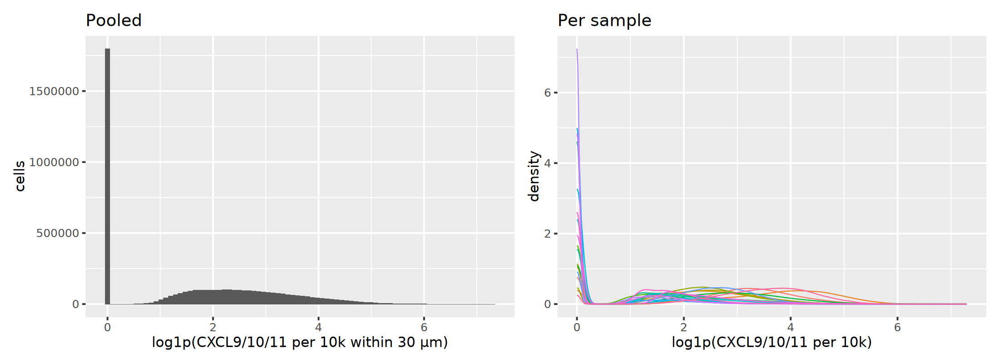

In [13]:
fig.size(height = 4, width = 11, res = 200)
p1 <- ggplot(cells_cont, aes(cxcl_log)) + geom_histogram(bins = 80) +
    labs(x = "log1p(CXCL9/10/11 per 10k within 30 µm)", y = "cells", title = "Pooled")
p2 <- ggplot(cells_cont, aes(cxcl_log, colour = SampleID)) +
    geom_density(linewidth = 0.3) + theme(legend.position = "none") +
    labs(x = "log1p(CXCL9/10/11 per 10k)", y = "density", title = "Per sample")
p1 + p2

print(cells_cont[, .(frac_zero = round(mean(cxcl_per10k == 0), 3),
                     median = round(median(cxcl_per10k), 2),
                     p95 = round(quantile(cxcl_per10k, 0.95), 2),
                     med_nb = median(n_neighbors)),
                 by = .(MMRstatus, SampleID)][order(MMRstatus, median)])

### 4b. Where the previous binary CXCR3L call sits on this axis

`cxcl_pos_tile` is a **tile-level** call: a tile is positive when ≥50% of its
cells are CXCR3L+, so cells inside a positive tile can sit in a chemokine-free
pocket. Rather than a single cut-point, the figures show the band spanning the
median of CXCL− cells and the median of CXCL+ cells for each arm. A narrow band
means the binary label tracked the continuous axis closely; a wide one shows how
much was discarded.

In [14]:
thr_by_sample <- cells_cont[, .(
    med_neg = median(cxcl_log[cxcl_pos_tile == "CXCL_neg"]),
    med_pos = median(cxcl_log[cxcl_pos_tile == "CXCL_pos"]),
    p05_pos = quantile(cxcl_log[cxcl_pos_tile == "CXCL_pos"], 0.05)
), by = .(SampleID, MMRstatus)][order(MMRstatus, med_pos)]
print(thr_by_sample)

cat("\nsamples where >=5% of CXCL+ cells have zero chemokine within 30 um:",
    thr_by_sample[p05_pos == 0, .N], "/", nrow(thr_by_sample), "\n")

thr_arm <- thr_by_sample[, .(lo = median(med_neg), hi = median(med_pos)), by = MMRstatus]
print(thr_arm[, .(MMRstatus, lo = round(lo, 3), hi = round(hi, 3))])

                  SampleID MMRstatus   med_neg  med_pos  p05_pos
                    <char>    <char>     <num>    <num>    <num>
 1:                  G4671      MMRd 1.9761678 2.973625 1.873518
 2:                  G4423      MMRd 2.0162909 3.034591 1.973789
 3:                  G4554      MMRd 0.9066503 3.185020 1.744083
 4:                   C123      MMRd 1.8605714 3.241814 1.868505
 5:                   C164      MMRd 1.9553116 3.275895 2.194362
 6:                  G4595      MMRd 2.0089893 3.525390 1.635873
 7:                 Jax001      MMRd 2.6161036 3.830110 2.544158
 8:                   C110      MMRd 2.1219667 4.110516 2.364899
 9:             G4669_reg1      MMRp 0.0000000 2.597038 0.000000
10:        G4738_Beta10_08      MMRp 1.0173475 2.762899 1.570945
11:             G4669_reg0      MMRp 0.0000000 2.773808 1.739282
12: G4659-CP-MET_VMSC04701      MMRp 0.0000000 3.170115 1.623478
13:                  G4630      MMRp 0.0000000 3.236711 1.806296
14:        G4738_Beta10_0

### 4c. Shared plotting helpers

Defined here, immediately after `thr_arm`, because every figure from section 6
onward uses them.

In [15]:
## Minimum readable text size. cowplot scales axis text to ~0.85 of the base
## size, so every text element is set explicitly here rather than inherited,
## and nothing is allowed below BASE_PT.
BASE_PT <- 8

theme_tf <- function(base = BASE_PT) {
    b <- max(base, BASE_PT)
    cowplot::theme_cowplot(b) +
    theme(panel.spacing    = unit(4, "pt"),
          strip.background = element_blank(),
          strip.text       = element_text(size = b, face = "plain"),
          axis.text        = element_text(size = BASE_PT),
          axis.text.x      = element_text(size = BASE_PT),
          axis.text.y      = element_text(size = BASE_PT),
          axis.title       = element_text(size = b),
          ## population names carry the bold weight; gene names sit below, plain
          plot.title       = element_text(size = b + 1, hjust = 0.5, face = "bold"),
          plot.subtitle    = element_text(size = BASE_PT, hjust = 0.5,
                                          colour = "grey15", face = "plain"),
          plot.caption     = element_text(size = BASE_PT, colour = "grey25"),
          legend.title     = element_text(size = BASE_PT),
          legend.text      = element_text(size = BASE_PT),
          legend.key.width = unit(8, "pt"),
          plot.margin      = margin(4, 6, 4, 4))
}

## Wrap long labels so they never run past their panel.
wrap_lab <- function(x, width = 18) {
    vapply(x, function(s) paste(strwrap(s, width = width), collapse = "\n"),
           character(1), USE.NAMES = FALSE)
}

## Long figure subtitles wrap to the figure width rather than being clipped.
wrap_sub <- function(x, width = 100) {
    paste(strwrap(paste(x, collapse = " "), width = width), collapse = "\n")
}

arm_label <- function(.mmr) {
    if (exists("n_pat_arm")) {
        paste0(.mmr, " (n = ", n_pat_arm[MMRstatus == .mmr, n_pat_arm], " patients)")
    } else .mmr
}

## Red dashed line = the epithelial/stromal interface.
## Dotted line = median local chemokine density among CXCR3L+ cells for that arm,
## i.e. where the previous binary call sat on this continuous axis.
## The distance axis is fixed at +/- DIST_LIM on every plot so panels are
## directly comparable and centred on the interface.
interface_guides <- function(.mmr = NULL, show_line = TRUE) {
    band <- if (is.null(.mmr)) thr_arm else thr_arm[MMRstatus == .mmr]
    g <- list(
        geom_vline(xintercept = 0, linetype = "dashed", colour = "red", linewidth = 0.3),
        coord_cartesian(xlim = c(-DIST_LIM, DIST_LIM), expand = FALSE),
        scale_x_continuous(breaks = seq(-DIST_LIM, DIST_LIM, by = 50))
    )
    if (show_line) {
        g <- c(list(geom_hline(data = band, inherit.aes = FALSE, aes(yintercept = hi),
                               linetype = "dotted", colour = "black", linewidth = 0.3)), g)
    }
    g
}

stopifnot(exists("thr_arm"), nrow(thr_arm) > 0)
cat("helpers defined\n")

helpers defined


## 5. Binning and per-patient aggregation

One resolution for every panel: 10 µm distance bins and 10 equal-width bins on
the log1p chemokine scale. Bin edges are shared across both MMR arms so the two
figures can be read against each other.

Two tables are built. `abund_comb` is the percentage of **all retained cells**
in a bin belonging to each population: the estimator used in Figure S5B/S5C.
`expr_comb` is the pooled transcript ratio within each patient × bin.

The abundance denominator comes from `cells_cont`, not from the population-long
table: the populations are nested (Tcd8-CXCL13-comb inside CD8-all, Myeloid-ISG
inside the myeloid pool), so a denominator built from the long table would
return 100% for the containing population by construction.

In [16]:
mid <- function(b) (head(b, -1) + tail(b, -1)) / 2

dist_breaks <- seq(-DIST_LIM, DIST_LIM, by = DIST_BIN)
cxcl_breaks <- seq(0, max(cells_cont$cxcl_log, na.rm = TRUE), length.out = CXCL_N_BINS + 1)
X_W <- diff(dist_breaks)[1]
Y_W <- diff(cxcl_breaks)[1]

assign_bins <- function(tbl) {
    xb <- cut(tbl$dist_interface_signed, dist_breaks, include.lowest = TRUE)
    yb <- cut(tbl$cxcl_log,              cxcl_breaks, include.lowest = TRUE)
    tbl[, `:=`(xbin  = as.character(xb), ybin  = as.character(yb),
               x_mid = mid(dist_breaks)[as.integer(xb)],
               y_mid = mid(cxcl_breaks)[as.integer(yb)])]
    tbl[!is.na(xbin) & !is.na(ybin)]
}

cells_cont <- assign_bins(cells_cont)
BINCOLS    <- c("xbin", "ybin", "x_mid", "y_mid")

n_pat_arm <- unique(cells_cont[, .(PatientID, MMRstatus)])[, .(n_pat_arm = .N), by = MMRstatus]
print(n_pat_arm)

   MMRstatus n_pat_arm
      <char>     <int>
1:      MMRp         6
2:      MMRd         8


In [17]:
## ---- population membership (long; a cell can belong to more than one) ---
pop_lookup <- rbindlist(lapply(names(POPS_ALL), function(p)
    data.table(population = p, cell_state = POPS_ALL[[p]])))

popcells <- merge(cells_cont, pop_lookup, by = "cell_state", allow.cartesian = TRUE)
cat("cell x population rows:", nrow(popcells), "\n\n")
print(popcells[, .N, by = .(population, MMRstatus)] %>%
      dcast(population ~ MMRstatus, value.var = "N"))

cell x population rows: 459190 

Key: <population>
             population   MMRd  MMRp
                 <char>  <int> <int>
 1:             CD8-all  28950  4715
 2:         Myeloid-ISG  43629 15023
 3:      Myeloid-mregDC   5330  5769
 4: Myeloid-noDC-noGran 179942 99189
 5:         Tcd4-CXCL13   7567  1940
 6:      Tcd4-Treg-comb  14377 11669
 7:    Tcd8-CXCL13-LAG3   3642   546
 8:    Tcd8-CXCL13-comb  11100  1998
 9:           Tcd8-GZMK   6175   973
10:          Tcd8-HOBIT   6864   979
11:   Tplzf-gdlike-comb   7863   950


In [18]:
## ---- ABUNDANCE: % of all retained cells in the bin ----------------------
all_pat <- cells_cont[, .(n_all = .N), by = c("MMRstatus", "PatientID", BINCOLS)]
pop_pat <- popcells[, .(n_pop = .N), by = c("population", "MMRstatus", "PatientID", BINCOLS)]

abund_pat <- merge(pop_pat, all_pat, by = c("MMRstatus", "PatientID", BINCOLS))[
    n_all >= MIN_CELLS][, pct := 100 * n_pop / n_all]

## a population cannot be ~100% of all cells everywhere
chk <- abund_pat[, .(median_pct = round(median(pct), 2)), by = population][order(-median_pct)]
print(chk)
if (any(chk$median_pct > 95)) stop("denominator is wrong: a population is ~100% of all cells")

             population median_pct
                 <char>      <num>
 1: Myeloid-noDC-noGran       8.21
 2:         Myeloid-ISG       2.04
 3:      Tcd4-Treg-comb       1.19
 4:             CD8-all       0.86
 5:      Myeloid-mregDC       0.58
 6:    Tcd8-CXCL13-comb       0.42
 7:         Tcd4-CXCL13       0.37
 8:   Tplzf-gdlike-comb       0.29
 9:          Tcd8-HOBIT       0.26
10:           Tcd8-GZMK       0.25
11:    Tcd8-CXCL13-LAG3       0.16


In [19]:
## ---- EXPRESSION: pooled ratio within patient x bin ----------------------
GENES_EXPR <- unique(c(GENES_B, GENES_C, GENES_C_CTRL))

expr_mat <- counts_all[GENES_EXPR, popcells$cell_id, drop = FALSE] %>%
    Matrix::t() %>% as.matrix() %>% as.data.table()
expr_long <- cbind(
    popcells[, c("cell_id", "population", "MMRstatus", "PatientID",
                 "total_counts_cell", "dist_interface_signed", "cxcl_log", BINCOLS),
             with = FALSE],
    expr_mat
)
expr_long <- melt(expr_long, measure.vars = GENES_EXPR,
                  variable.name = "gene", value.name = "gene_count")
expr_long[, gene := as.character(gene)]

expr_pat <- expr_long[
    , .(n_cells = .N, gene_sum = sum(gene_count), total_sum = sum(total_counts_cell)),
    by = c("population", "gene", "MMRstatus", "PatientID", BINCOLS)
][n_cells >= MIN_CELLS][, prop_RNA := gene_sum / pmax(total_sum, 1)]

cat("expression patient-bins:", nrow(expr_pat), "\n")

expression patient-bins: 63921 


In [20]:
## ---- combine across patients by MEDIAN, masking per arm -----------------
combine_median <- function(tbl, value_col, group_cols) {
    out <- tbl[, .(n_pat = uniqueN(PatientID),
                   val   = median(get(value_col)),
                   lo    = quantile(get(value_col), 0.25),
                   hi    = quantile(get(value_col), 0.75)),
               by = group_cols]
    out <- merge(out, n_pat_arm, by = "MMRstatus")
    out[n_pat >= ceiling(MIN_PAT_FRAC * n_pat_arm)]
}

abund_comb <- combine_median(abund_pat, "pct",      c("population", "MMRstatus", BINCOLS))
expr_comb  <- combine_median(expr_pat,  "prop_RNA", c("population", "gene", "MMRstatus", BINCOLS))

cat("abundance bins surviving mask:", nrow(abund_comb), "\n")
cat("expression bins surviving mask:", nrow(expr_comb), "\n\n")
print(dcast(abund_comb[, .N, by = .(population, MMRstatus)],
            population ~ MMRstatus, value.var = "N"))

abundance bins surviving mask: 3055 
expression bins surviving mask: 7469 

Key: <population>
             population  MMRd  MMRp
                 <char> <int> <int>
 1:             CD8-all   230   130
 2:         Myeloid-ISG   252   181
 3:      Myeloid-mregDC   146   124
 4: Myeloid-noDC-noGran   282   234
 5:         Tcd4-CXCL13   150    79
 6:      Tcd4-Treg-comb   168   131
 7:    Tcd8-CXCL13-LAG3   107    25
 8:    Tcd8-CXCL13-comb   185    75
 9:           Tcd8-GZMK   102    55
10:          Tcd8-HOBIT   128    54
11:   Tplzf-gdlike-comb   161    56


### 5a. Bin support

Raw chemokine magnitudes are preserved, so the arms occupy different parts of
the y axis and MMRp is sparser at high chemokine. That is a property of the
data, not a plotting failure, but it must be shown rather than left as
unexplained white space. Outlined bins fall below the mask and are blank in the
figures that follow.

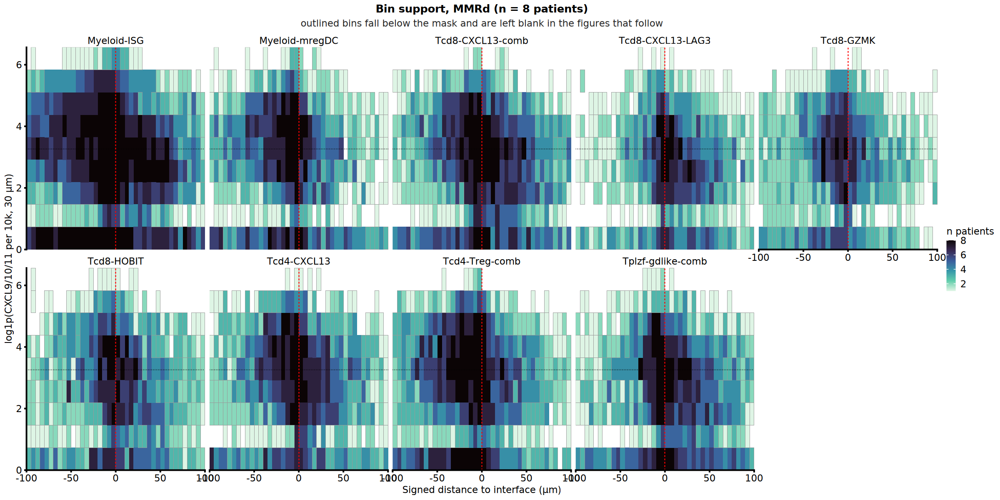

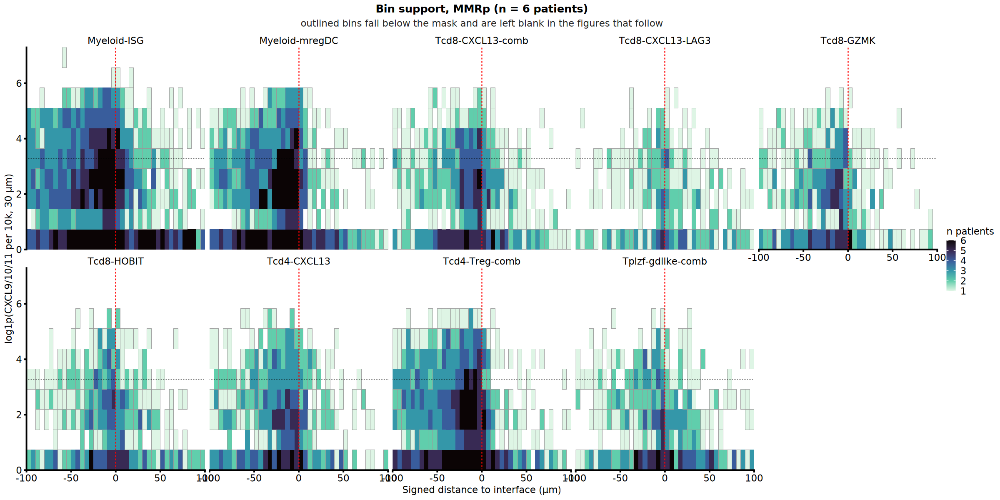

In [21]:
support <- abund_pat[, .(n_pat = uniqueN(PatientID)),
                     by = c("population", "MMRstatus", BINCOLS)]
support <- merge(support, n_pat_arm, by = "MMRstatus")
support[, passes := n_pat >= ceiling(MIN_PAT_FRAC * n_pat_arm)]

plot_support <- function(.mmr, pops) {
    d <- support[MMRstatus == .mmr & population %in% pops]
    d[, population := factor(wrap_lab(population, 18),
                             levels = wrap_lab(pops, 18))]
    ggplot(d, aes(x_mid, y_mid, fill = n_pat)) +
        geom_tile(width = X_W, height = Y_W) +
        geom_tile(data = d[passes == FALSE], width = X_W, height = Y_W,
                  fill = NA, colour = "grey60", linewidth = 0.12) +
        facet_wrap(~ population, nrow = 2) +
        interface_guides(.mmr) +
        scale_fill_viridis_c(option = "mako", direction = -1) +
        labs(title = paste0("Bin support, ", arm_label(.mmr)),
             subtitle = wrap_sub("outlined bins fall below the mask and are left blank in the figures that follow"),
             x = "Signed distance to interface (µm)",
             y = "log1p(CXCL9/10/11 per 10k, 30 µm)", fill = "n patients") +
        theme_tf()
}

fig.size(height = 6, width = 12, res = 200)
for (a in ARMS) print(plot_support(a, names(POPS_A)))

## 6. Panel A, abundance

Threshold-free counterpart of **Figure 4D** (Myeloid-ISG, Myeloid-mregDC) and
**Figure 4E** (T cell subsets), with the estimator of **Figure S5B/S5C**
(percentage of all cells in the bin). In Figure 4 the hub categories appear as
three lines in a legend; here that grouping is the y axis.

Fill scale is free per population: abundances differ by more than an order of
magnitude between, for example, Tcd4-Treg-comb and Myeloid-mregDC, and a shared
scale would render the rarer populations flat.

In [22]:
pop_panel <- function(d, .mmr, fill_lab, opt = 'Reds', pct = FALSE, # opt = "magma"
                      base = BASE_PT, barheight = 3.2) {
    ggplot(d, aes(x_mid, y_mid, fill = val)) +
        geom_tile(width = X_W, height = Y_W) +
        interface_guides(.mmr) +
        #scale_fill_viridis_c(direction = -1, option = opt, na.value = "grey92",
        scale_fill_distiller(palette = opt, direction = 1, na.value = 'grey92',
                             labels = if (pct) scales::percent else waiver(),
                             guide = guide_colourbar(barwidth = 0.38,
                                                     barheight = barheight,
                                                     title.position = "top")) +
        labs(fill = fill_lab) +
        theme_tf(base) +
        theme(legend.title = element_text(size = max(base, BASE_PT)))
}

grid_of_panels <- function(tbl, keys, .mmr, title, subtitle,
                           fill_lab, ncol, opt = "magma", pct = FALSE,
                           key_col = "population") {
    panels <- lapply(seq_along(keys), function(i) {
        d <- tbl[get(key_col) == keys[i]]
        if (nrow(d) == 0) return(patchwork::plot_spacer() + labs(title = wrap_lab(keys[i], 20)))
        pop_panel(d, .mmr, paste0(wrap_lab(keys[i], 16), "\n(% of all cells)"), opt, pct) +
            labs(title = wrap_lab(keys[i], 20),
                 x = if (i > length(keys) - ncol) "Signed distance (µm)" else NULL,
                 y = if ((i - 1) %% ncol == 0) "log1p(CXCL per 10k)" else NULL)
    })
    patchwork::wrap_plots(panels, ncol = ncol) +
        patchwork::plot_annotation(
            title = title, subtitle = wrap_sub(subtitle),
            theme = theme(plot.title = element_text(size = 12, face = "bold"),
                          plot.subtitle = element_text(size = BASE_PT, colour = "grey25")))
}

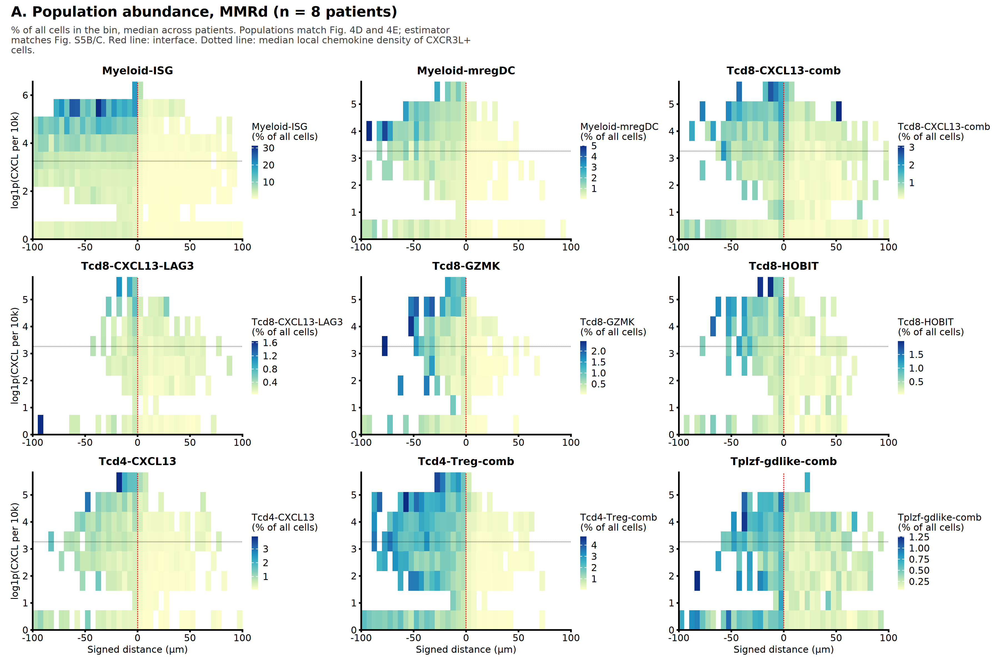

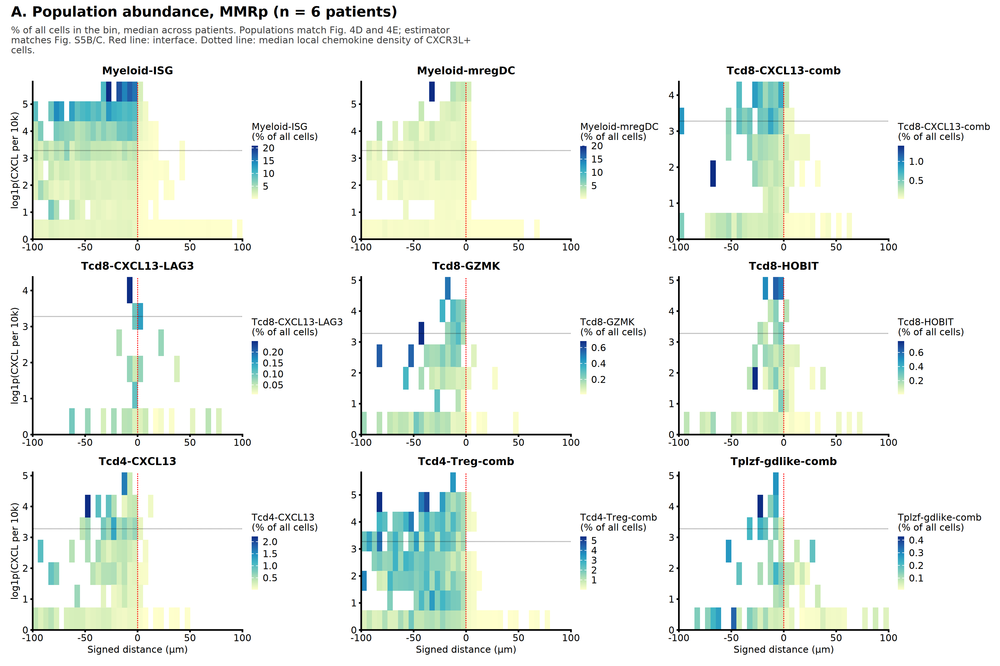

In [23]:
fig.size(height = 8, width = 12, res = 300)
for (a in ARMS) {
    p <- grid_of_panels(
        abund_comb[MMRstatus == a], names(POPS_A), a,
        title = paste0("A. Population abundance, ", arm_label(a)),
        subtitle = paste("% of all cells in the bin, median across patients.",
                         "Populations match Fig. 4D and 4E; estimator matches Fig. S5B/C.",
                         "Red line: interface. Dotted line: median local chemokine density of CXCR3L+ cells."),
        fill_lab = "% of\ncells", ncol = 3, opt = 'YlGnBu') # opt = "viridis"
    print(p)
    ggsave(file.path(outdir_tf, sprintf("panelA_abundance_%s.png", a)),
           p, width = 12, height = 8, dpi = 300, bg = "white")
}

## 7. Panel B, marker expression in CD8 T cells

*ITGAE*, *CCR7* and *CXCL13* in all CD8 T cells and in Tcd8-CXCL13-comb. There
is no counterpart panel in Figure 4 or S5, both of which show abundance only;
this addresses the expression half of the reviewer's request.

*CXCL13* within Tcd8-CXCL13-comb is circular by construction: the subtype is
defined by that gene, and is retained as an internal control, expected to be
flat and high.

In [24]:
`%||%` <- function(a, b) if (is.null(a)) b else a

expr_grid <- function(.mmr, pops, genes, title, subtitle, fname, ncol = NULL) {
    ncol <- ncol %||% length(genes)
    keys <- CJ(population = pops, gene = genes, sorted = FALSE)
    panels <- lapply(seq_len(nrow(keys)), function(i) {
        d <- expr_comb[MMRstatus == .mmr & population == keys$population[i] &
                       gene == keys$gene[i]]
        pop_lab <- wrap_lab(keys$population[i], 20)
        if (nrow(d) == 0) {
            return(patchwork::plot_spacer() +
                   labs(title = pop_lab, subtitle = keys$gene[i]) + theme_tf())
        }
        ## population above (bold), gene below (plain)
        pop_panel(d, .mmr, paste0(keys$gene[i], "\n(% of transcripts)"),
                  opt = "Reds", pct = TRUE) +
            labs(title = pop_lab, subtitle = keys$gene[i],
                 x = if (i > nrow(keys) - ncol) "Signed distance (µm)" else NULL,
                 y = if ((i - 1) %% ncol == 0) "log1p(CXCL per 10k)" else NULL)
    })
    p <- patchwork::wrap_plots(panels, ncol = ncol) +
        patchwork::plot_annotation(
            title = title, subtitle = wrap_sub(subtitle),
            theme = theme(plot.title = element_text(size = 12, face = "bold"),
                          plot.subtitle = element_text(size = BASE_PT, colour = "grey25")))
    ggsave(file.path(outdir_tf, fname), p,
           width = 3.4 * ncol, height = 3.3 * ceiling(nrow(keys) / ncol),
           dpi = 300, bg = "white", limitsize = FALSE)
    p
}

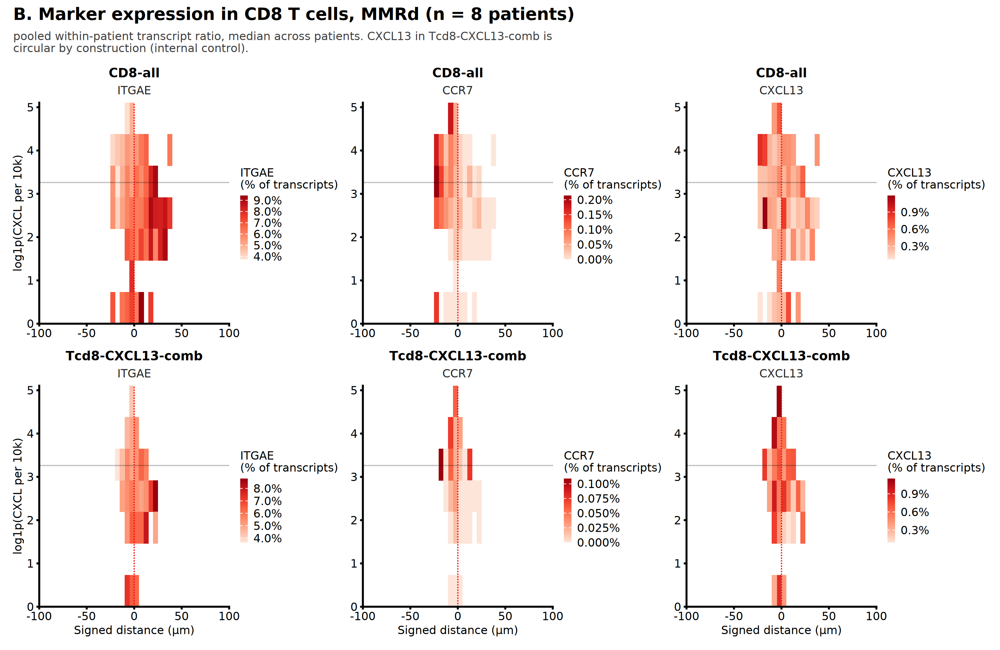

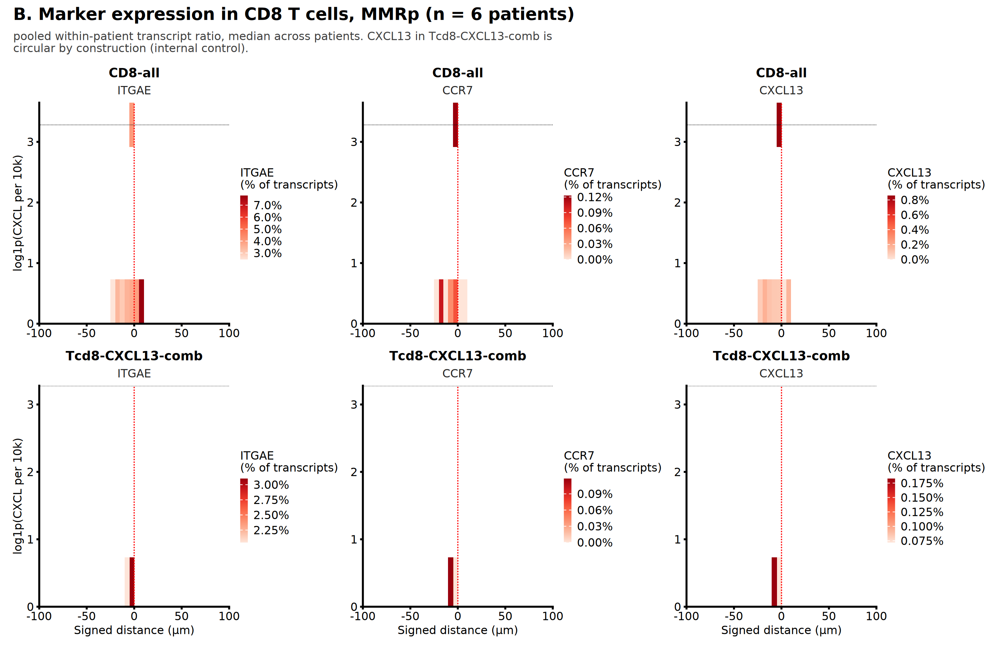

In [25]:
fig.size(height = 6.5, width = 10, res = 300)
for (a in ARMS) {
    print(expr_grid(a, names(POPS_B), GENES_B,
        title = paste0("B. Marker expression in CD8 T cells, ", arm_label(a)),
        subtitle = paste("pooled within-patient transcript ratio, median across patients.",
                         "CXCL13 in Tcd8-CXCL13-comb is circular by construction (internal control)."),
        fname = sprintf("panelB_expression_CD8_%s.png", a), ncol = 3))
}

## 8. Panel C. ISG programme in myeloid cells

*ISG15*, *STAT1*, *CD274*, *GBP1*, *TAP1* and *IDO1* in Myeloid-ISG and in
pooled myeloid excluding DC and granulocytes. Figure S1C reports *IDO1* and
*CD274* in the Myeloid-ISG cluster from scRNA-seq; this places the programme in
situ across the interface.

Note that Myeloid-ISG is **defined** by an interferon programme, so high
expression of these genes within it is definitional rather than a finding. The
pooled myeloid column is where the spatial distribution carries information.

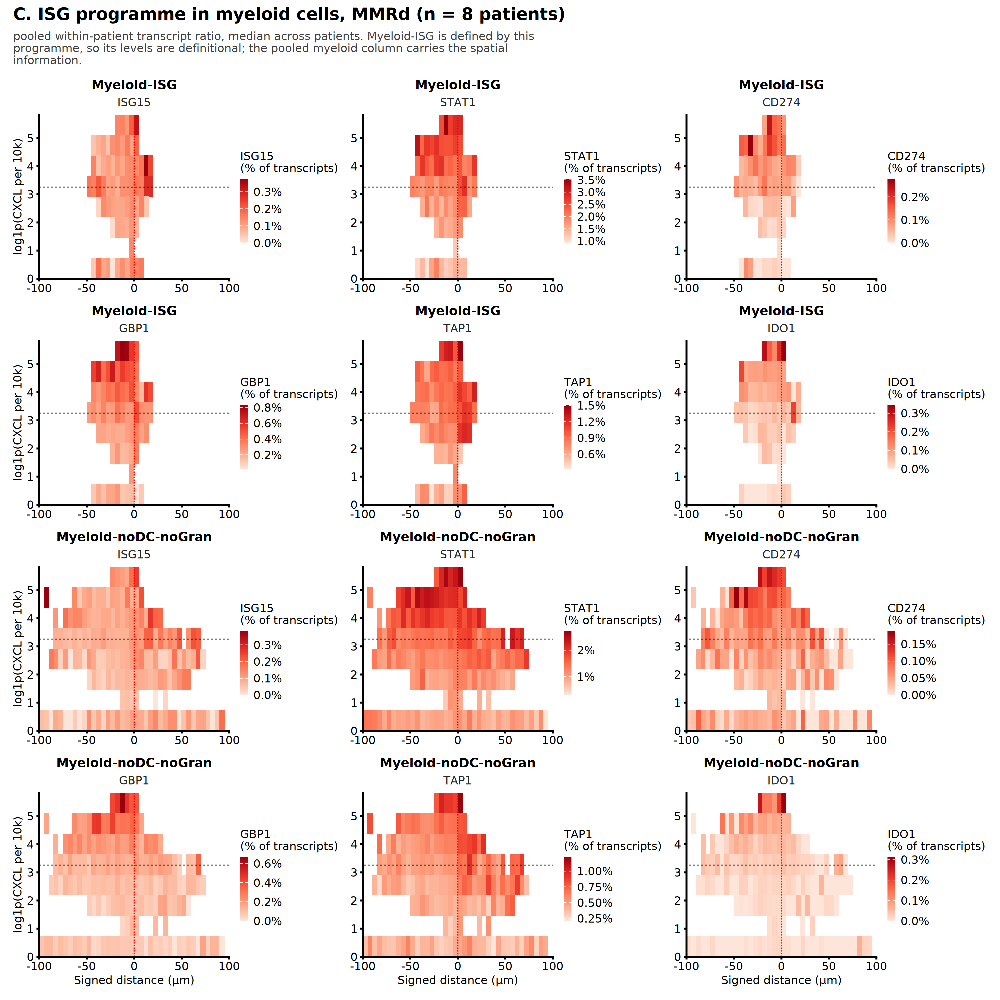

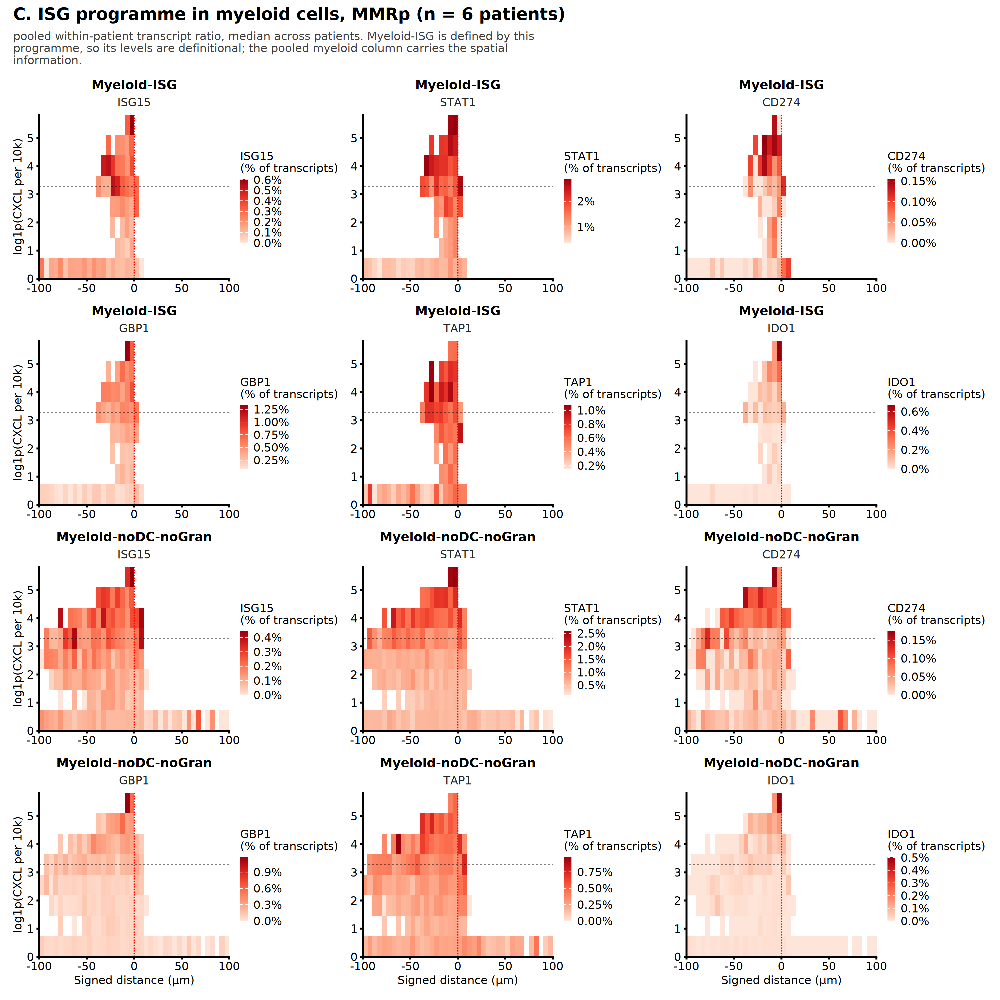

In [26]:
fig.size(height = 10, width = 10, res = 300)
for (a in ARMS) {
    print(expr_grid(a, names(POPS_C), GENES_C,
        title = paste0("C. ISG programme in myeloid cells, ", arm_label(a)),
        subtitle = paste("pooled within-patient transcript ratio, median across patients.",
                         "Myeloid-ISG is defined by this programme, so its levels are definitional;",
                         "the pooled myeloid column carries the spatial information."),
        fname = sprintf("panelC_expression_myeloid_%s.png", a), ncol = 3))
}

### 8a. Panel C positive controls

*CXCL9* and *CXCL10* contribute to the y axis through each cell's neighbours.
Their own transcripts are excluded from their own y value, but neighbouring
Myeloid-ISG cells are not, so expression of these two genes is **expected** to
track the chemokine axis. They are shown separately and labelled as positive
controls rather than mixed in with the rest of the programme.

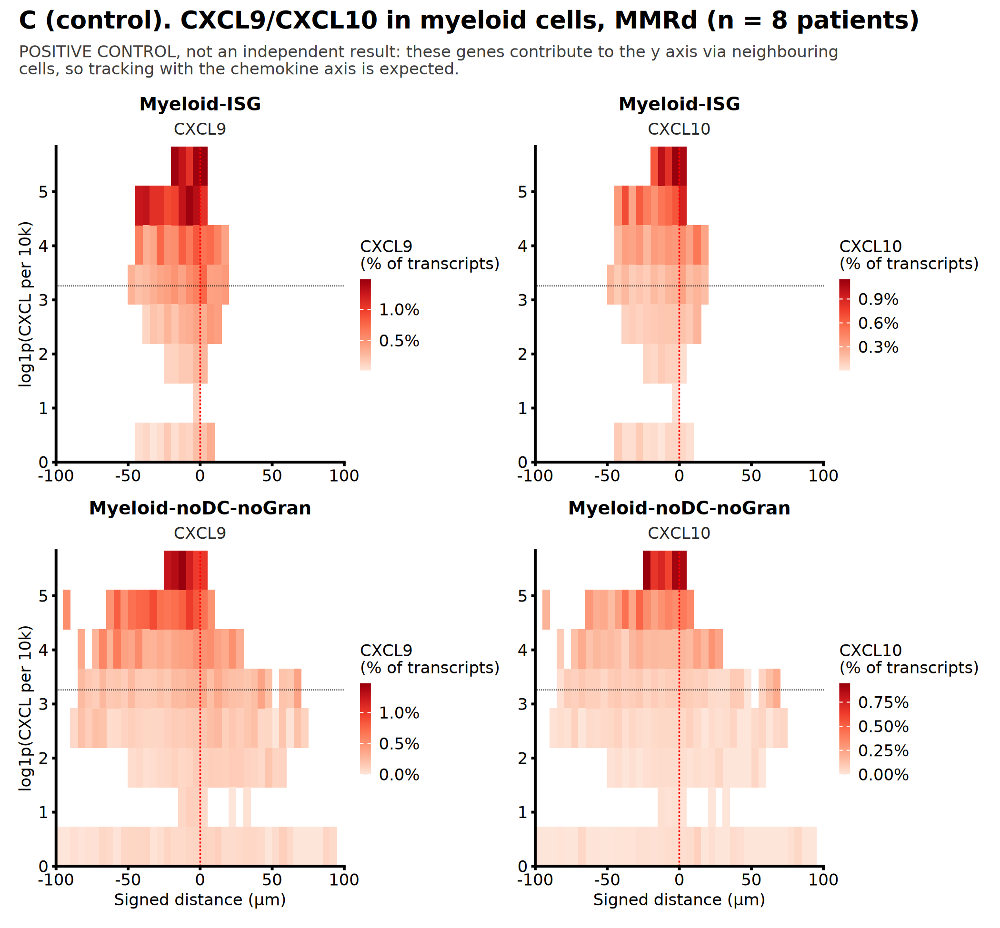

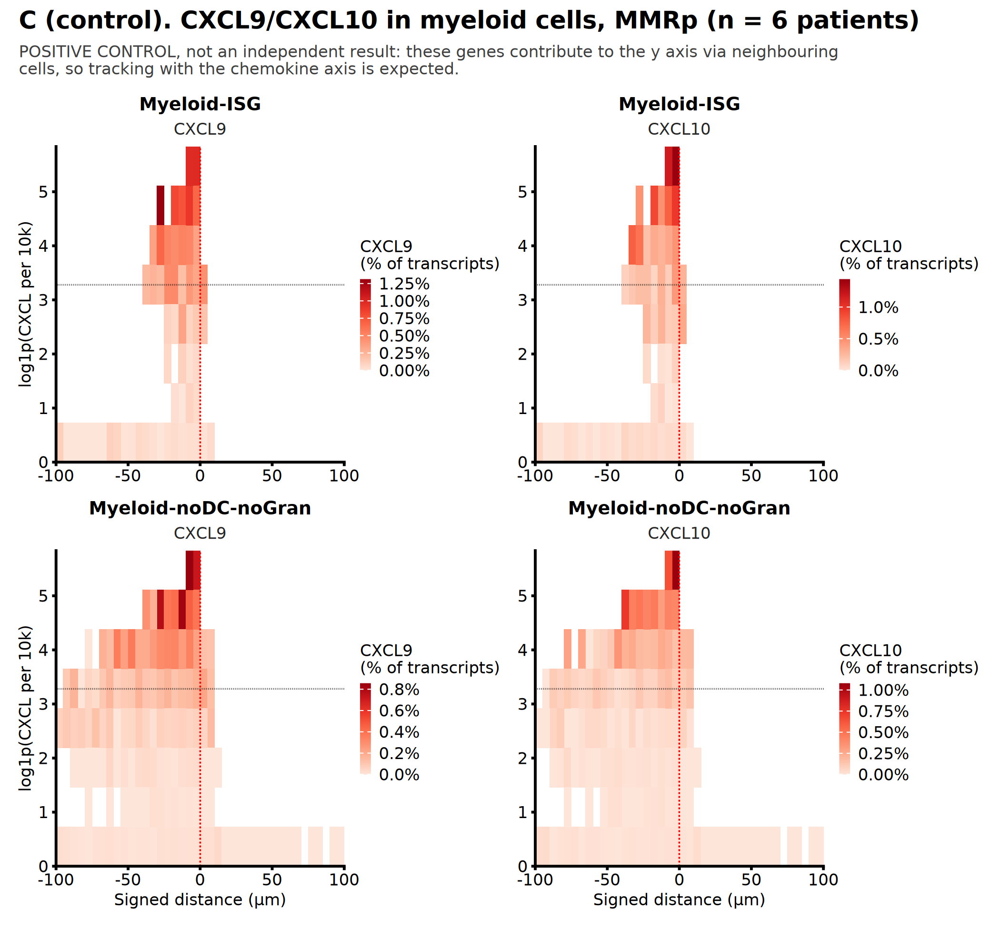

In [27]:
fig.size(height = 6.5, width = 7, res = 300)
for (a in ARMS) {
    print(expr_grid(a, names(POPS_C), GENES_C_CTRL,
        title = paste0("C (control). CXCL9/CXCL10 in myeloid cells, ", arm_label(a)),
        subtitle = paste("POSITIVE CONTROL, not an independent result:",
                         "these genes contribute to the y axis via neighbouring cells,",
                         "so tracking with the chemokine axis is expected."),
        fname = sprintf("panelC_control_CXCL910_%s.png", a), ncol = 2))
}

## 9. Per-cell scatter with twin density contours

A companion to the binned panels. MERFISH per-cell counts are 0-2 for most
genes, so point position rather than point colour carries the signal:

- **grey contours**, 2D kernel density of the reference set
- **orange contours**, density of the subset of interest

For **panel A** the reference is all retained cells and the subset is the
population, so displacement shows where that population sits relative to tissue
generally. For **panels B and C** the reference is all cells of the population
and the subset is cells expressing the gene.

Cells are subsampled equally per patient so no single specimen determines the
contours, and bandwidths are set explicitly because µm and log1p-chemokine units
are not comparable.

In [28]:
subsample_per_patient <- function(d, n = N_SCATTER_PER_PATIENT) {
    d[, .SD[sample(.N, min(.N, n))], by = PatientID]
}

twin_contour_panel <- function(ref, sub, .mmr, title, show_x, show_y,
                               subtitle = NULL) {
    if (nrow(ref) < 100 || nrow(sub) < 30) {
        return(patchwork::plot_spacer() +
               labs(title = title, subtitle = subtitle) + theme_tf())
    }
    ## widened bandwidth; contours on normalised density so the lowest levels
    ## (isolated small islands where detection is sparse) are not drawn at all
    h <- KDE_ADJUST * c(MASS::bandwidth.nrd(ref$dist_interface_signed),
                        MASS::bandwidth.nrd(ref$cxcl_log))
    ggplot(ref, aes(dist_interface_signed, cxcl_log)) +
        geom_point(colour = "grey88", size = 0.22, stroke = 0) +
        geom_point(data = sub, colour = "#C2410C", size = 0.4, stroke = 0, alpha = 0.5) +
        geom_density_2d(colour = "grey40", linewidth = 0.25, h = h,
                        contour_var = "ndensity", breaks = CONTOUR_BREAKS) +
        geom_density_2d(data = sub, colour = "#C2410C", linewidth = 0.4, h = h,
                        contour_var = "ndensity", breaks = CONTOUR_BREAKS) +
        interface_guides(.mmr) +
        labs(title = title, subtitle = subtitle,
             x = if (show_x) "Signed distance (µm)" else NULL,
             y = if (show_y) "log1p(CXCL per 10k)" else NULL) +
        theme_tf()
}

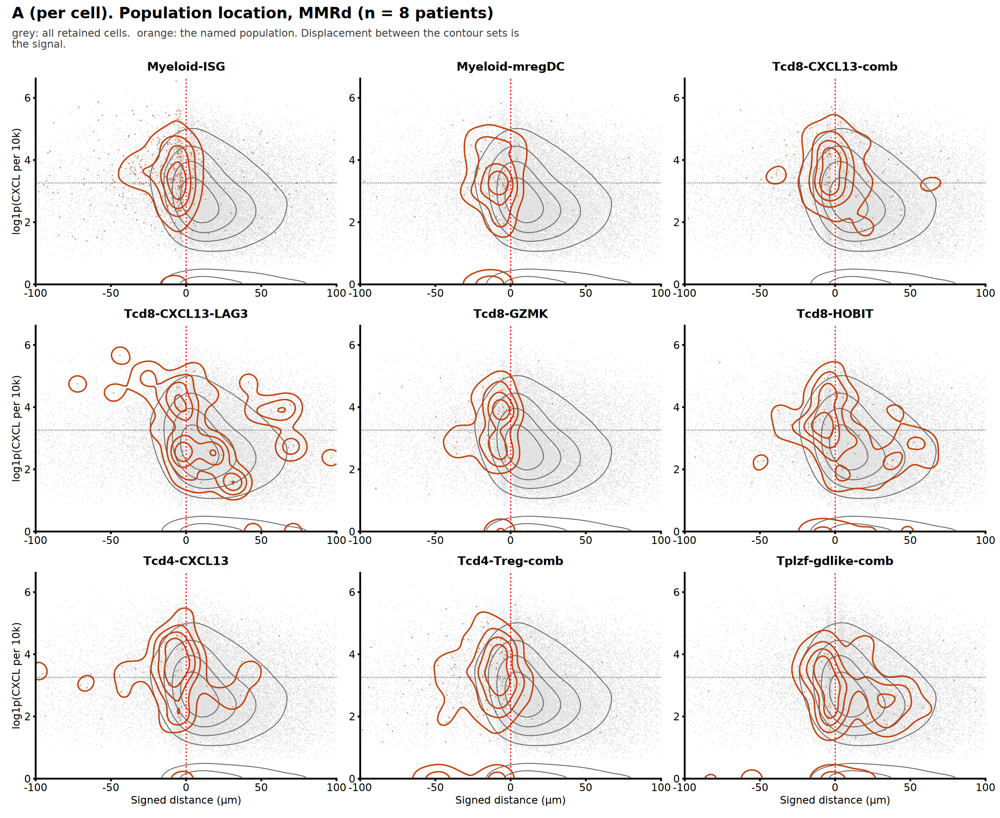

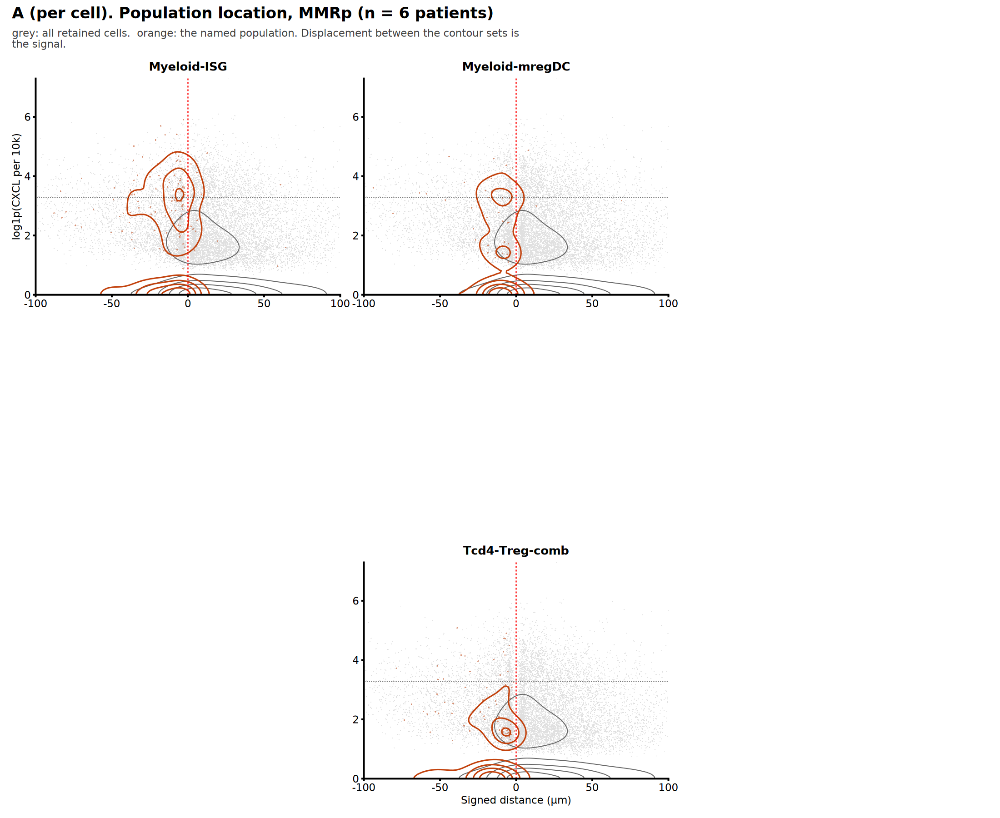

In [29]:
## ---- scatter for panel A: all cells vs each population ------------------
scatter_A <- function(.mmr, ncol = 3) {
    ref_all <- subsample_per_patient(cells_cont[MMRstatus == .mmr])
    keys <- names(POPS_A)
    panels <- lapply(seq_along(keys), function(i) {
        sub <- ref_all[cell_state %in% POPS_A[[keys[i]]]]
        twin_contour_panel(ref_all, sub, .mmr, wrap_lab(keys[i], 20),
                           show_x = i > length(keys) - ncol,
                           show_y = (i - 1) %% ncol == 0)
    })
    p <- patchwork::wrap_plots(panels, ncol = ncol) +
        patchwork::plot_annotation(
            title = paste0("A (per cell). Population location, ", arm_label(.mmr)),
            subtitle = wrap_sub(c("grey: all retained cells.  orange: the named population.",
                                  "Displacement between the contour sets is the signal.")),
            theme = theme(plot.title = element_text(size = 12, face = "bold"),
                          plot.subtitle = element_text(size = BASE_PT, colour = "grey25")))
    ggsave(file.path(outdir_tf, sprintf("panelA_scatter_%s.png", .mmr)),
           p, width = 3.4 * ncol, height = 3.3 * ceiling(length(keys) / ncol),
           dpi = 300, bg = "white", limitsize = FALSE)
    p
}

fig.size(height = 9, width = 11, res = 200)
for (a in ARMS) print(scatter_A(a))

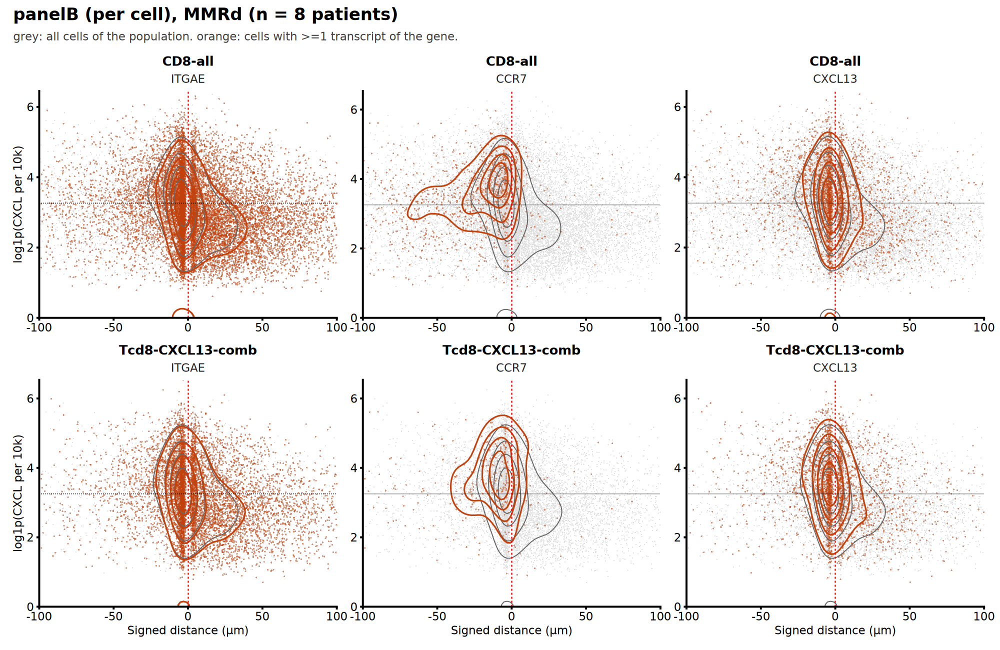

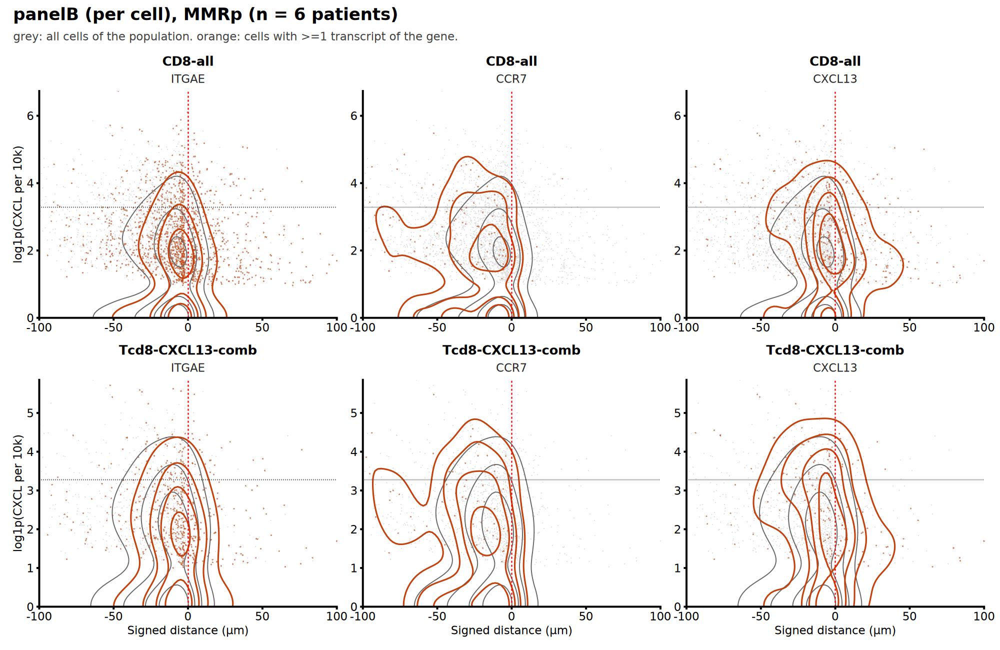

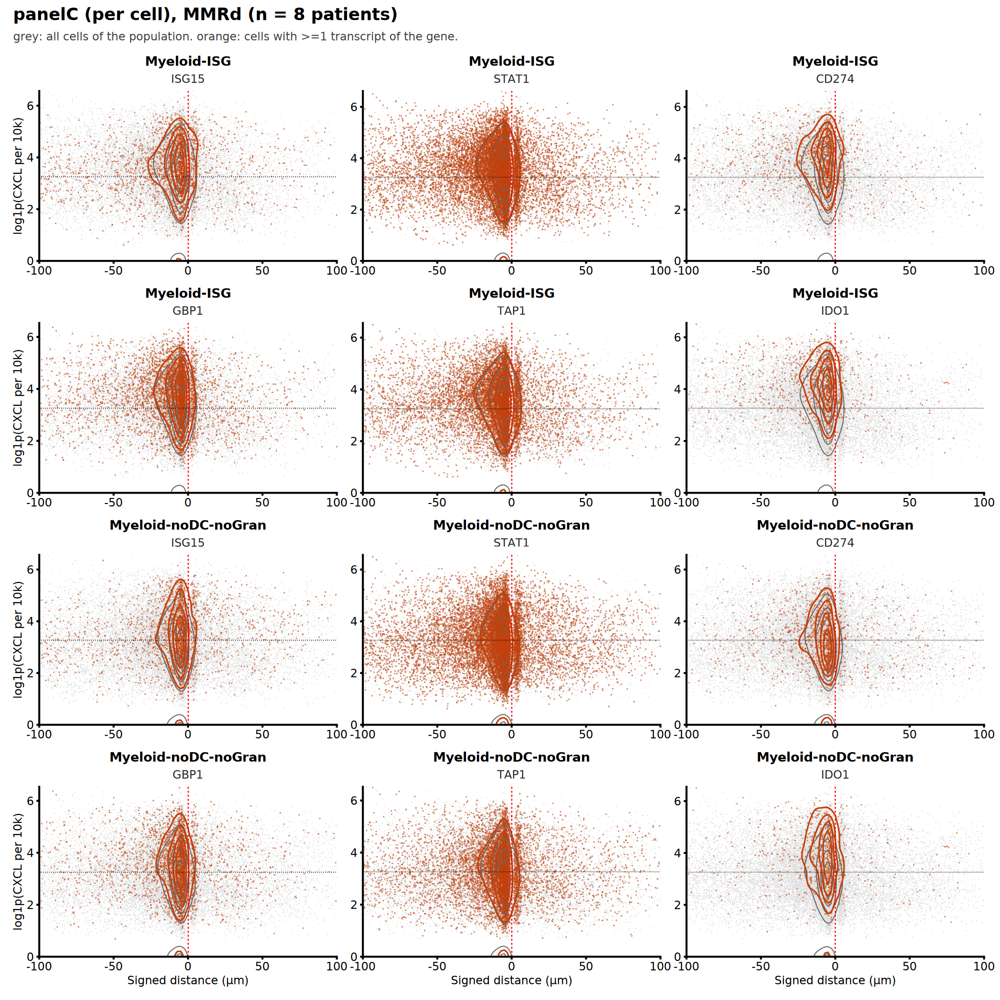

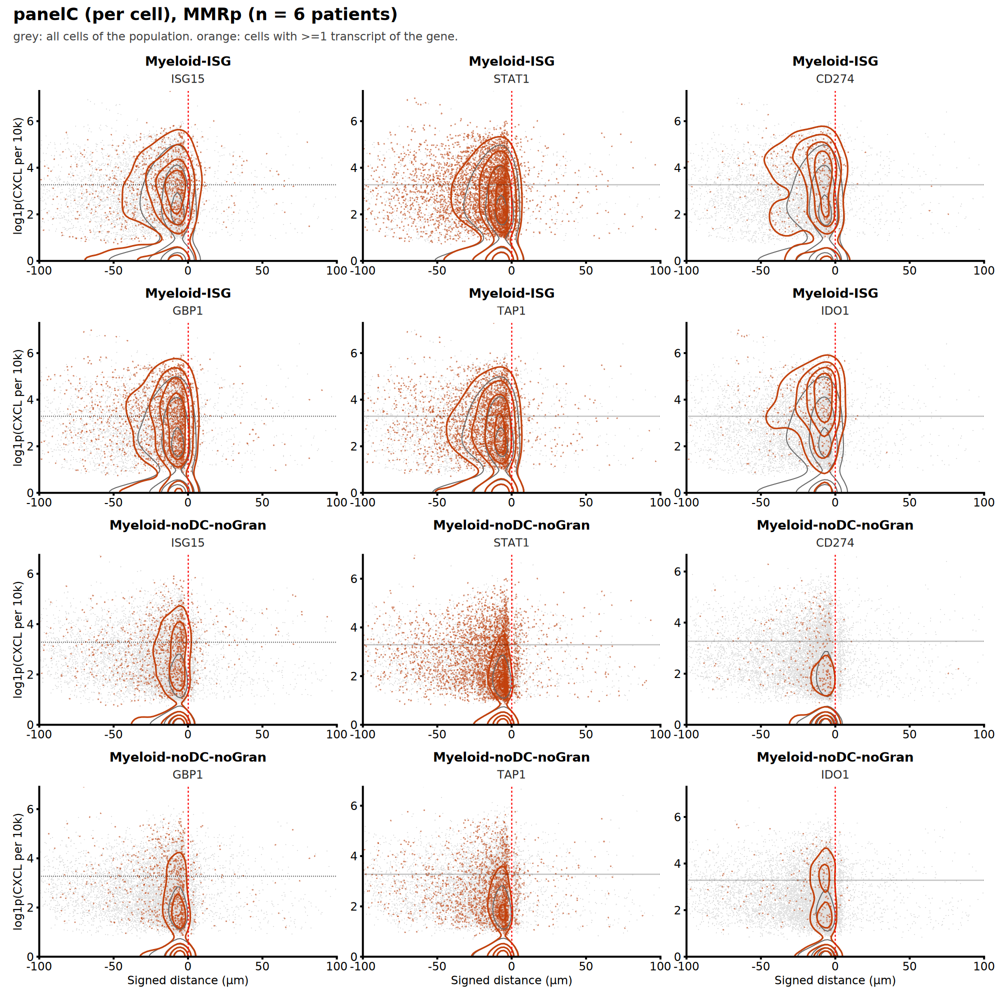

In [30]:
## ---- scatter for expression panels: population vs expressing cells ------
scatter_expr <- function(.mmr, pops, genes, tag, ncol = NULL) {
    ncol <- ncol %||% length(genes)
    keys <- CJ(population = pops, gene = genes, sorted = FALSE)
    panels <- lapply(seq_len(nrow(keys)), function(i) {
        .pop <- keys$population[i]; .g <- keys$gene[i]
        ref <- subsample_per_patient(
            expr_long[MMRstatus == .mmr & population == .pop & gene == .g])
        sub <- ref[gene_count > 0]
        twin_contour_panel(ref, sub, .mmr, wrap_lab(.pop, 20),
                           show_x = i > nrow(keys) - ncol,
                           show_y = (i - 1) %% ncol == 0,
                           subtitle = .g)
    })
    p <- patchwork::wrap_plots(panels, ncol = ncol) +
        patchwork::plot_annotation(
            title = paste0(tag, " (per cell), ", arm_label(.mmr)),
            subtitle = wrap_sub(c("grey: all cells of the population.",
                                  "orange: cells with >=1 transcript of the gene.")),
            theme = theme(plot.title = element_text(size = 12, face = "bold"),
                          plot.subtitle = element_text(size = BASE_PT, colour = "grey25")))
    ggsave(file.path(outdir_tf, sprintf("%s_scatter_%s.png", tag, .mmr)),
           p, width = 3.1 * ncol, height = 3.0 * ceiling(nrow(keys) / ncol),
           dpi = 300, bg = "white", limitsize = FALSE)
    p
}

fig.size(height = 6.5, width = 10, res = 200)
for (a in ARMS) print(scatter_expr(a, names(POPS_B), GENES_B, "panelB", ncol = 3))

fig.size(height = 10, width = 10, res = 200)
for (a in ARMS) print(scatter_expr(a, names(POPS_C), GENES_C, "panelC", ncol = 3))

## 10. Final figures

*"…visualize abundance or expression of key markers (Tcd8-CXCL13, Myeloid-ISG, ITGAE, CCR7) as a 2D heatmap over those two axes."*

Two versions, MMRd only, each sized for a letter page with room for a legend.

- **v1, named subsets.** Tcd8-CXCL13-comb with *ITGAE*, *CCR7*, *CXCL13*; Myeloid-ISG with *STAT1*, *TAP1*, *GBP1*.
- **v2, parent populations.** The same genes in all CD8 T cells and in pooled myeloid excluding DC and granulocytes.

The ISG genes are the three most highly expressed of the six profiled (STAT1
3.5%, TAP1 1.5%, GBP1 0.8% of transcripts in Myeloid-ISG; ISG15, CD274 and IDO1
are roughly an order of magnitude lower).

*CXCL13* in Tcd8-CXCL13-comb is circular by construction: the subtype is
defined by that gene, and should be read as an internal control. 

written: v1_named_subsets 


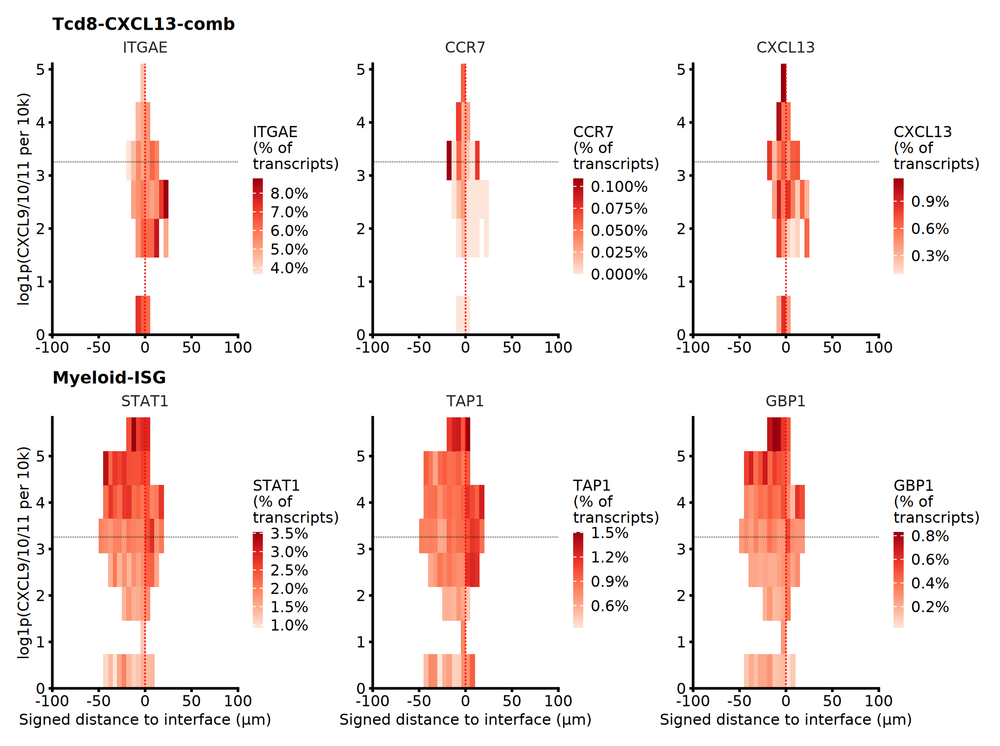

written: v2_parent_populations 


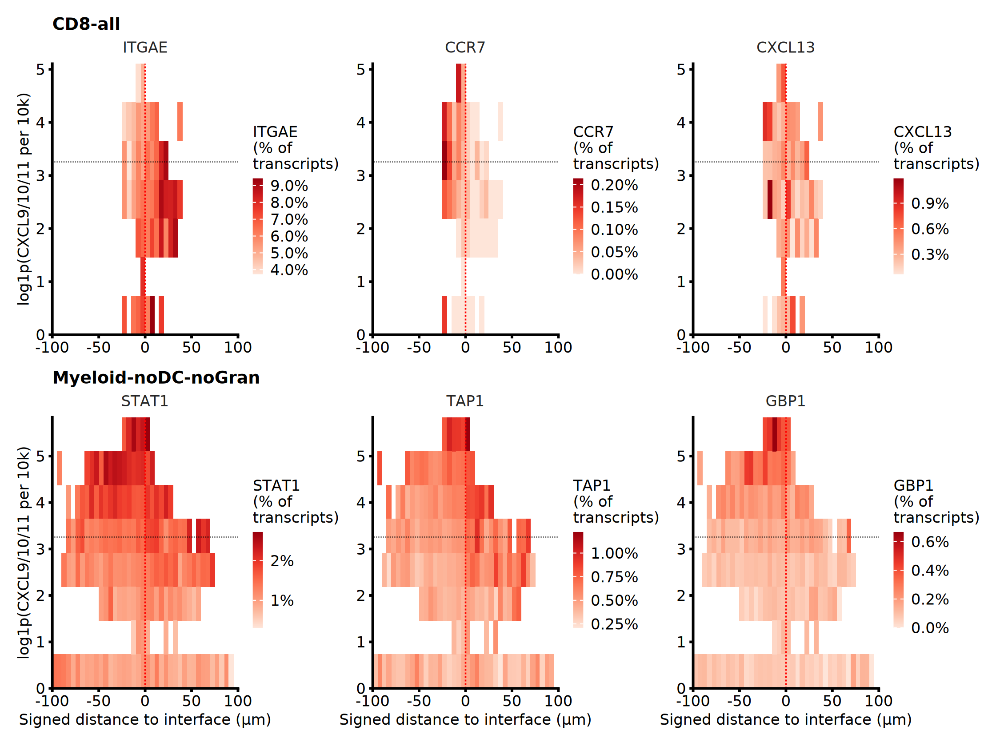

In [31]:
final_figure <- function(spec, .arm = FINAL_ARM, base = 7) {

    pops <- names(spec)
    ncol <- max(lengths(spec))

    keys <- rbindlist(lapply(pops, function(p)
        data.table(population = p, gene = spec[[p]], col = seq_along(spec[[p]]))))
    keys[, row := match(population, pops)]

    panels <- lapply(seq_len(nrow(keys)), function(i) {
        .pop <- keys$population[i]; .g <- keys$gene[i]
        d <- expr_comb[MMRstatus == .arm & population == .pop & gene == .g]
        if (nrow(d) == 0) {
            return(patchwork::plot_spacer() +
                   labs(title = wrap_lab(.pop, 18), subtitle = .g) + theme_tf(base))
        }
        ## Population name sits ABOVE the gene name and carries the bold weight.
        ## It is printed once per row, on the leftmost panel; the remaining panels
        ## keep a blank title so the gene names stay vertically aligned.
        pop_panel(d, .arm, paste0(.g, "\n(% of\ntranscripts)"),
                  "Reds", pct = TRUE, base = base, barheight = 3.6) +
            labs(title    = if (keys$col[i] == 1) wrap_lab(.pop, 18) else " ",
                 subtitle = .g,
                 x = if (keys$row[i] == length(pops)) "Signed distance to interface (µm)" else NULL,
                 y = if (keys$col[i] == 1) "log1p(CXCL9/10/11 per 10k)" else NULL) +
            theme(plot.title    = element_text(size = base + 2, face = "bold", hjust = 0),
                  plot.subtitle = element_text(size = max(base, BASE_PT), face = "plain",
                                               colour = "grey15", hjust = 0.5))
    })

    patchwork::wrap_plots(panels, ncol = ncol)
}

for (nm in names(FINAL_SPECS)) {
    p <- final_figure(FINAL_SPECS[[nm]])
    fig.size(height = FINAL_H, width = FINAL_W, res = 300)
    print(p)
    ggsave(file.path(outdir_tf, sprintf("FINAL_%s_%s.pdf", nm, FINAL_ARM)),
           p, width = FINAL_W, height = FINAL_H, units = "in", device = cairo_pdf)
    ggsave(file.path(outdir_tf, sprintf("FINAL_%s_%s.png", nm, FINAL_ARM)),
           p, width = FINAL_W, height = FINAL_H, units = "in", dpi = 400, bg = "white")
    cat("written:", nm, "\n")
}

### Suggested legend for the final figures

> **Threshold-free spatial distribution of marker expression at the
> stromal/epithelial interface (MMRd, n = [[n]] patients).** For every cell
> within 100 µm of an epithelial/stromal interface, a signed distance in
> micrometres (negative into stroma, positive into epithelium) and the local
> *CXCL9/10/11* transcript density within a fixed 30 µm radius (per 10,000
> transcripts in that neighbourhood, log1p scale) were computed without any
> categorical thresholding. Colour shows expression of the indicated gene within
> the indicated population, as the pooled ratio of gene to total transcripts
> within each patient and bin, combined across patients by the median. Bins with
> fewer than [[MIN_CELLS]] cells in a patient, or contributed by fewer than half
> the patients in the arm, are left blank. Red dashed line marks the interface
> (0 µm); dotted line marks the median local chemokine density of cells in
> CXCR3L+ tiles. *CXCL13* in Tcd8-CXCL13-comb is shown as an internal control,
> since that subtype is defined by *CXCL13* expression.

## 11. QC

**11a, depth across the plane.** The pooled-ratio estimator already puts depth
in the denominator, so this is confirmatory; a strong gradient near the interface
would still be worth knowing about.

**11b, reproduce the Figure 4C-E profiles.** Re-imposes the original
stratification on this table. If these do not match the published panels,
something diverged upstream and nothing else can be trusted.

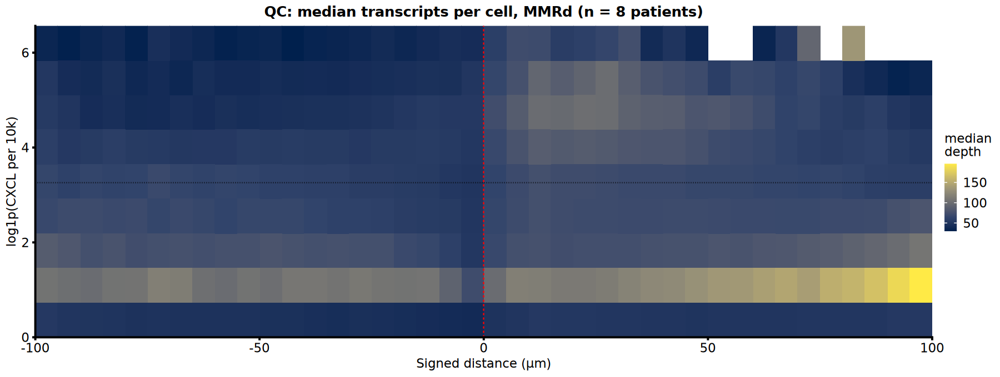

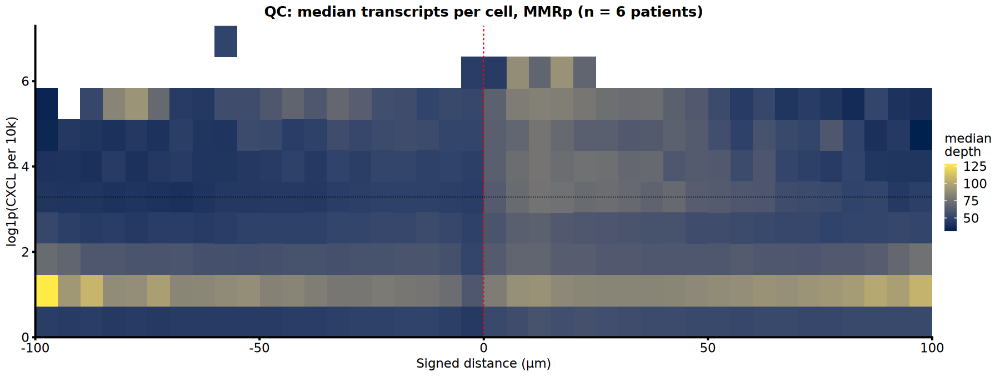

In [32]:
## 11a, transcript depth
depth <- cells_cont[, .(median_depth = median(total_counts_cell), n = .N),
                    by = c("MMRstatus", BINCOLS)][n >= MIN_CELLS]

fig.size(height = 3.4, width = 9, res = 200)
for (a in ARMS) {
    print(ggplot(depth[MMRstatus == a], aes(x_mid, y_mid, fill = median_depth)) +
              geom_tile(width = X_W, height = Y_W) +
              interface_guides(a) +
              scale_fill_viridis_c(option = "cividis") +
              labs(title = paste0("QC: median transcripts per cell, ", arm_label(a)),
                   x = "Signed distance (µm)", y = "log1p(CXCL per 10k)",
                   fill = "median\ndepth") +
              theme_tf())
}

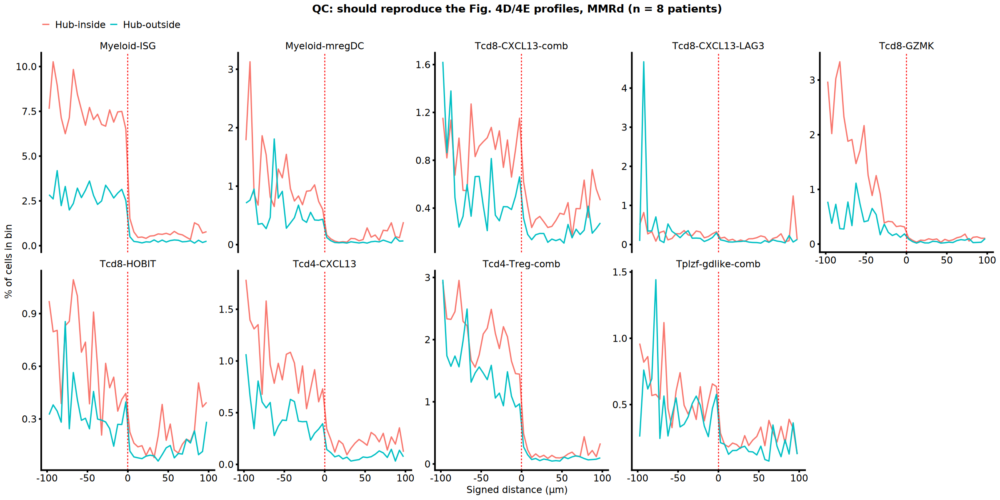

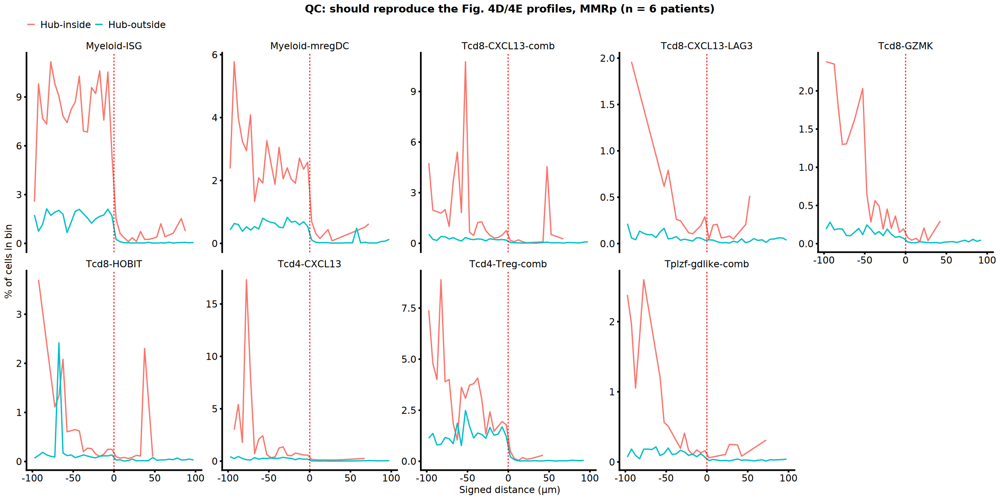

In [33]:
## 11b, re-impose the original Fig. 4 stratification
qc_base <- cells_cont[
    (closest_interface_type == "CXCLpos tumor & CXCLpos stroma" & cxcl_pos_tile == "CXCL_pos") |
    (closest_interface_type == "CXCLneg tumor & CXCLneg stroma" & cxcl_pos_tile == "CXCL_neg")
][, interface_class := fifelse(cxcl_pos_tile == "CXCL_pos", "Hub-inside", "Hub-outside")]

qc_all <- qc_base[, .(n_all = .N),
                  by = .(interface_class, MMRstatus, PatientID, x_mid)]
qc_pop <- merge(qc_base, pop_lookup, by = "cell_state", allow.cartesian = TRUE)[
    , .(n_pop = .N), by = .(population, interface_class, MMRstatus, PatientID, x_mid)]

qc_prof <- merge(qc_pop, qc_all,
                 by = c("interface_class", "MMRstatus", "PatientID", "x_mid"))[
    , pct := 100 * n_pop / n_all]

fig.size(height = 6, width = 12, res = 200)
for (a in ARMS) {
    d <- qc_prof[MMRstatus == a & population %in% names(POPS_A),
                 .(pct = median(pct)), by = .(population, interface_class, x_mid)]
    if (nrow(d) == 0) next
    d[, population := factor(wrap_lab(population, 18),
                             levels = wrap_lab(names(POPS_A), 18))]
    print(ggplot(d, aes(x_mid, pct, colour = interface_class)) +
              geom_line(linewidth = 0.4) +
              facet_wrap(~ population, nrow = 2, scales = "free_y") +
              geom_vline(xintercept = 0, linetype = "dashed",
                         colour = "red", linewidth = 0.3) +
              labs(title = paste0("QC: should reproduce the Fig. 4D/4E profiles, ",
                                  arm_label(a)),
                   x = "Signed distance (µm)", y = "% of cells in bin", colour = NULL) +
              theme_tf() + theme(legend.position = "top"))
}

## 12. Export

In [34]:
fwrite(abund_comb, file.path(outdir_tf, "panelA_abundance_median.csv"))
fwrite(abund_pat,  file.path(outdir_tf, "panelA_abundance_per_patient.csv"))
fwrite(expr_comb,  file.path(outdir_tf, "panelBC_expression_median.csv"))
fwrite(expr_pat,   file.path(outdir_tf, "panelBC_expression_per_patient.csv"))
fwrite(support,    file.path(outdir_tf, "bin_support.csv"))
fwrite(thr_by_sample, file.path(outdir_tf, "cxcr3l_band_per_sample.csv"))

saveRDS(list(
    params = list(RADIUS_UM = RADIUS_UM, DIST_LIM = DIST_LIM, DIST_BIN = DIST_BIN,
                  CXCL_N_BINS = CXCL_N_BINS, MIN_CELLS = MIN_CELLS,
                  MIN_PAT_FRAC = MIN_PAT_FRAC, TUMOR_PATTERN = TUMOR_PATTERN,
                  TUMOR_REGIONS = TUMOR_REGIONS, KEEP_TESSERA = KEEP_TESSERA,
                  APPLY_REGION_FILTER = APPLY_REGION_FILTER),
    genes       = list(axis = GENES_AXIS, panelB = GENES_B,
                       panelC = GENES_C, panelC_control = GENES_C_CTRL),
    populations = list(A = POPS_A, B = POPS_B, C = POPS_C),
    relabel     = MANUAL_RELABEL,
    thr_arm     = thr_arm,
    dist_breaks = dist_breaks,
    cxcl_breaks = cxcl_breaks
), file.path(outdir_tf, "run_parameters.rds"))

cat("written to", outdir_tf, "\n")
sessionInfo()

written to ./fig4_threshold_free_outputs 


R version 4.5.3 (2026-03-11)
Platform: x86_64-conda-linux-gnu
Running under: AlmaLinux 8.10 (Cerulean Leopard)

Matrix products: default
BLAS/LAPACK: /home/helikarlab/mukta/.conda/envs/r-analysis-env/lib/libopenblasp-r0.3.34.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Chicago
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] cowplot_1.2.0      Matrix_1.7-5       dbscan_1.2.6       furrr_0.4.0       
 [5] future_1.75.0      geos_0.2.5         sf_1.1-2           readxl_1.5.0      
 [9] patchwork_1.3.2    ggrastr_1.0.2   